### NLP Multi-classification Modeling
    Artifacts: Metaverse GitHub Repositories

Created By: Mijail Q. Mariano


---- 

#### ``Project Description:``

Use README.md text to learn the primary programming language used in "Metaverse" related repos and associated topics. Design an NLP predictive model that accurately identifies the *[programming language]* * used in "metaverse" related repos. 

*The predicted programming language used in this analysis is the primary (in overall repo percentage) that is found in the GitHub repository searched.* *

In [1414]:
# notebook dependencies 
%matplotlib inline
import matplotlib as mlp
mlp.rcParams['figure.dpi'] = 300

import os
import pandas as pd
import numpy as np

# visualization imports
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

# regular expression import
import re

# JSON import
import json

# importing BeautifulSoup for parsing HTML/XTML
from bs4 import BeautifulSoup

# request module for connecting to APIs
from requests import get

# text prepare modules
import acquire
import prepare

# uni-code library
import unicodedata

# natural language toolkit library/modules
import nltk
from nltk.stem import PorterStemmer, LancasterStemmer, WordNetLemmatizer

from nltk.tokenize.toktok import ToktokTokenizer
from nltk.corpus import stopwords

from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud

In [1415]:
# acquire and data processing

df = pd.read_csv("metaverse.csv")

print(f'initial df shape: {df.shape}')
df.head()

initial df shape: (998, 3)


,repo,language,readme_contents
0,M3-org/awesome-metaverse,NaN,# Awesome Metaverse [![Awesome](https://awesom...
1,mvs-org/metaverse,C++,Metaverse Core Integration/staging Tree\n=====...
2,webaverse/app,JavaScript,"<img src=""docs/banner.jpeg"" width=100% />\n\n<..."
3,shadowcz007/awesome-metaverse,NaN,"# awesome-metaverse\n<a href=""https://awesome...."
4,vircadia/vircadia,C++,"<p align=""center""><a href=""https://vircadia.co..."


In [1416]:
# cleaning the data object type

df = prepare.clean_data_objects(df)
df.info()

df shape: (998, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998 entries, 0 to 997
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   repo             998 non-null    object
 1   language         998 non-null    object
 2   readme_contents  998 non-null    object
dtypes: object(3)
memory usage: 23.5+ KB


In [1417]:
# applying the mass_text_clean function on README.md contents

df["readme_contents"] = df["readme_contents"].apply(prepare.mass_text_clean)
df.head() # check out!

,repo,language,readme_contents
0,M3-org/awesome-metaverse,nan,awesome awesome awesome badge svg awesome list...
1,mvs-org/metaverse,C++,core integration staging tree build status tra...
2,webaverse/app,JavaScript,img src doc banner jpeg width 100 align center...
3,shadowcz007/awesome-metaverse,nan,awesome href awesome target blank img alt awes...
4,vircadia/vircadia,C++,align center href vircadia img src interface r...


In [1418]:
# viewing number of unique program languages and frequency in the dataset

print(f'unique language count: {df["language"].nunique()} ')
df["language"].value_counts()

unique language count: 39 


nan                 316
JavaScript          266
C#                   78
HTML                 72
TypeScript           70
Solidity             27
CSS                  23
Python               22
Rust                 16
Go                   15
C++                  14
Jupyter Notebook     11
Java                  7
ShaderLab             7
SCSS                  6
Vue                   5
Shell                 5
PHP                   5
SuperCollider         3
Clojure               3
Batchfile             2
Roff                  2
Swift                 2
C                     2
GLSL                  2
GDScript              2
Objective-C           2
Kotlin                2
HCL                   1
EJS                   1
PowerShell            1
Svelte                1
TeX                   1
Objective-C++         1
Cadence               1
Metal                 1
R                     1
LSL                   1
ASP.NET               1
Name: language, dtype: int64

In [1419]:
# bucketing related languages in the dataset for greater programming coverage of Metaverse topics/repos

df = prepare.update_languages(df)

print(f'unique language count: {df["language"].nunique()}')
print("percent change from original: {:.2f}%".format(((39 - df.language.nunique())/df.language.nunique()*100)))
df["language"].value_counts()

unique language count: 11
percent change from original: 254.55%


nan           316
Java          284
C             102
HTML           72
TypeScript     71
other          39
Python         33
Solidity       27
CSS            23
Rust           16
Go             15
Name: language, dtype: int64

In [1420]:
# breakdown of programming language percentage in dataset

languages = pd.concat([
    df["language"].value_counts(),
    df["language"].value_counts(normalize = True).round(2)],
    axis = 1)

languages.columns = ['frequency', 'df percentage']
languages

,frequency,df percentage
nan,316,0.32
Java,284,0.28
C,102,0.10
HTML,72,0.07
TypeScript,71,0.07
other,39,0.04
Python,33,0.03
Solidity,27,0.03
CSS,23,0.02
Rust,16,0.02


In [1421]:
# what are "nan" languages?

pd.set_option('display.max_rows', None)

null_language = df[df["language"] == "nan"]
null_language.shape

(316, 3)

In [1422]:
# number of repos with no programming language but contain content
# (observation) repos without programming languages, but contain text/README contents

print(f'records with missing language but contain readme contents: {len(null_language[(null_language["readme_contents"] != np.nan) & (null_language["readme_contents"] != "") & (null_language["readme_contents"] != "nan")])}')

records with missing language but contain readme contents: 162


In [1423]:
# ok, what percentage of the df has no programming language and no readme content?
# (observation) repos without programming languages or text/README contents

missing_lang_and_readme = len(null_language[(null_language["readme_contents"] == "nan") | (null_language["readme_contents"] == "") | (null_language["readme_contents"] == "nan") | (null_language["readme_contents"] == None)])
print(f'records w/ missing language and readme contents: {missing_lang_and_readme}')
print('percentage of total repos: {:.2f}'.format(missing_lang_and_readme/len(df)))

records w/ missing language and readme contents: 154
percentage of total repos: 0.15


In [1424]:
# how many whitespace values are there in readme_contents column?
# (observation) 60 records with blank README contents

len(df[df["readme_contents"] == ""])

60

In [1425]:
# for simplicity/ease of understanding the Null/missing values in readme column -- let's convert whitespace to "nan" text
# (observation) challenges in converting & counting whitespace/"nan" values to either np.nan or pd.None

df["readme_contents"] = df["readme_contents"].replace("", "nan")

len(df[df["readme_contents"] == ""]) # checks out! 

0

In [1426]:
# ok, what percentage of the df has no programming language and no readme content?
# (observation) repos without programming languages or text/README contents

complete_nulls = df[(df["language"] == "nan") & (df["readme_contents"] == "nan")]

missing_lang_and_readme = len(complete_nulls[complete_nulls["readme_contents"] == "nan"])
print(f'records w/ missing language and readme contents: {missing_lang_and_readme}')
print('percentage of total repos: {:.2f}'.format(missing_lang_and_readme/len(df))) # checks out!

records w/ missing language and readme contents: 154
percentage of total repos: 0.15


In [1427]:
# dropping records with missing program language
# (observation) Java becomes primary scripting language

df["langauge"] = df["language"].replace("nan", "text_only")
df = df[df["readme_contents"] != "nan"]

print(f'dataframe shape: {df.shape}')
df["language"].value_counts(normalize = True).round(2)

dataframe shape: (681, 4)


Java          0.34
nan           0.24
C             0.11
TypeScript    0.10
other         0.04
HTML          0.04
Python        0.04
Solidity      0.04
Rust          0.02
CSS           0.02
Go            0.01
Name: language, dtype: float64

In [1428]:
# README word count for ea. record/repo

df["word_count"] = df["readme_contents"].str.split().str.len()
df.head()

,repo,language,readme_contents,langauge,word_count
0,M3-org/awesome-metaverse,nan,awesome awesome awesome badge svg awesome list...,text_only,1552
1,mvs-org/metaverse,C,core integration staging tree build status tra...,C,555
2,webaverse/app,Java,img src doc banner jpeg width 100 align center...,Java,420
3,shadowcz007/awesome-metaverse,nan,awesome href awesome target blank img alt awes...,text_only,1588
4,vircadia/vircadia,C,align center href vircadia img src interface r...,C,432


In [1429]:
# what are the total number of words by programming language?
# capitalizing "other" language name

df["language"] = df["language"].replace("other", "Other")

sum_of_words = df.groupby("language")["word_count"].agg("sum").sort_values(ascending = False)
sum_of_words

language
nan           92471
Java          45402
C             17192
TypeScript    14300
Python        10090
Other          6886
HTML           6182
Rust           5226
Solidity       4420
Go             3399
CSS            1619
Name: word_count, dtype: int64

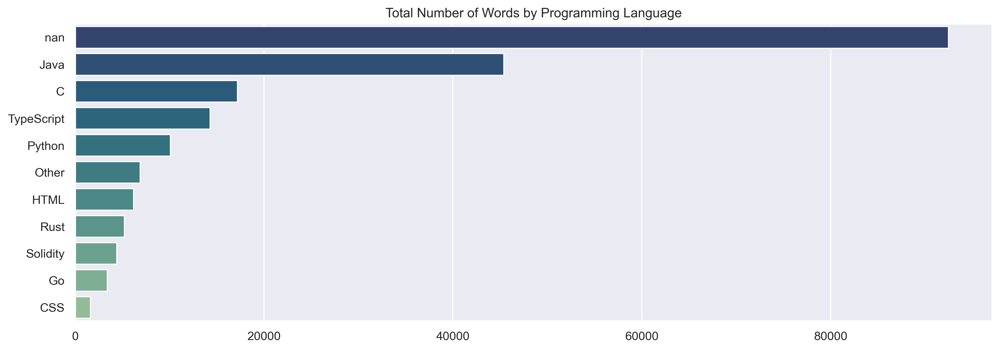

In [1430]:
# as a plot?
# (observation) Java, C, TypeScript, Python, and HTML/other = Top 5/6 "metaverse" programming languages by number of words
# consider number count (container) graphing method

plt.figure(figsize = (15, 5))
sns.barplot(x = sum_of_words, y = sum_of_words.index, palette = "crest_r")

plt.ylabel(None)
plt.xlabel(None)
plt.title("Total Number of Words by Programming Language")
plt.show()

In [1431]:
# what about average number of words by language?

mean_of_words = df.groupby("language")["word_count"].agg("mean").sort_values(ascending = False).round()
mean_of_words

language
nan           571.0
Python        388.0
Go            340.0
Rust          327.0
Other         246.0
C             229.0
HTML          221.0
TypeScript    220.0
Java          198.0
Solidity      170.0
CSS           101.0
Name: word_count, dtype: float64

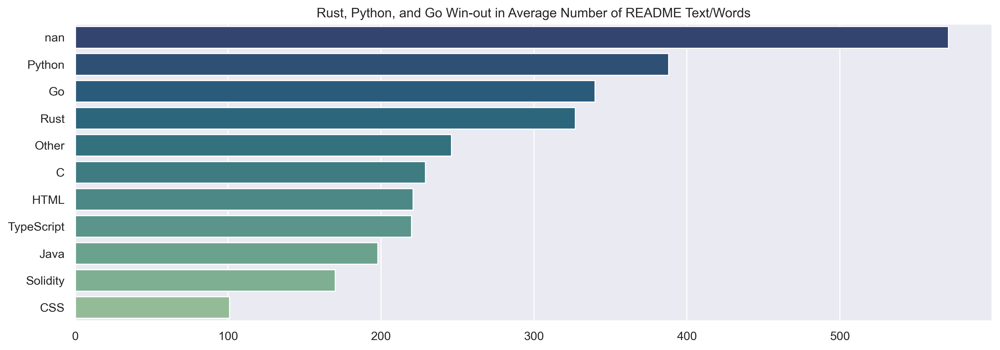

In [1432]:
# average README text/words by programming language

plt.figure(figsize = (15, 5))
sns.barplot(x = mean_of_words, y = mean_of_words.index, palette = "crest_r")

plt.ylabel(None)
plt.xlabel(None)
plt.title("Rust, Python, and Go Win-out in Average Number of README Text/Words")
plt.show()

#### **<u>``General Observations:``</u>**

On average, the following primary programming languages tend to contain more text/content in their README files:

- 1. Rust
- 2. Python
- 3. Go

----

In [1433]:
# splitting the dataset for exploratory analysis

train, validate, test = prepare.train_validate_test_split(df, "language")

train.head()

train shape: (380, 5)
validate shape: (164, 5)
test shape: (137, 5)


,repo,language,readme_contents,langauge,word_count
129,mvs-org/mvs-package,Other,mv package intead build data packed version pa...,other,226
931,EmillyMiranda/Metaverse,nan,ever play sandbox sandox www sandbox game,text_only,7
379,abhik-99/MetaverseSim,Rust,repo auction sim advert board built solana usi...,Rust,9
576,hongju-jeong/Capstone-Design1,C,mvp 2022 2017 0 00093,C,5
648,zchenlin/metaverse,HTML,soft dashboard pro demo creative tim soft dash...,HTML,1182


In [1434]:
# splitting larger dataset by specific programming language text/words

C_words = (" ".join(train[train["language"] == "C"]["readme_contents"])).split()
css_words = (" ".join(train[train["language"] == "CSS"]["readme_contents"])).split()

go_words = (" ".join(train[train["language"] == "Go"]["readme_contents"])).split()
html_words = (" ".join(train[train["language"] == "HTML"]["readme_contents"])).split()

java_words = (" ".join(train[train["language"] == "Java"]["readme_contents"])).split()
other_words = (" ".join(train[train["language"] == "Other"]["readme_contents"])).split()

python_words = (" ".join(train[train["language"] == "Python"]["readme_contents"])).split()
rust_words = (" ".join(train[train["language"] == "Rust"]["readme_contents"])).split()

solidity_words = (" ".join(train[train["language"] == "Solidity"]["readme_contents"])).split()
typescript_words = (" ".join(train[train["language"] == "TypeScript"]["readme_contents"])).split()

all_words = (" ".join(train.readme_contents)).split()

In [1435]:
# total number of words/elements in all_words_df

len(all_words)

141419

In [1436]:
# returning unique words in ea. dataset

# Python code to find frequency of each word
def freq(lst):
    # container to hold unique values
    container = []

    # loop till string values present in list str
    for ele in lst:            

        # checking for the duplicacy
        if ele not in container:

            # insert value in str2
            container.append(ele)
    
    # returning the count of unique words
    return len(container)

In [1437]:
# dataframe of ea. language, word counts, and number of unique values

count_df = pd.DataFrame({"language": ["All", 'C', 'CSS', 'Go', 'HTML', 'Java', 'Other', 'Python', 'Rust', 'Solidity', 'TypeScript'],
"word_count": [len(all_words), len(C_words), len(css_words), len(go_words), len(html_words), len(java_words), len(other_words), len(python_words), len(rust_words), len(solidity_words), len(typescript_words)],
"unique_words": [freq(all_words), freq(C_words), freq(css_words), freq(go_words), freq(html_words), freq(java_words), freq(other_words), freq(python_words), freq(rust_words), freq(solidity_words), freq(typescript_words)]}).sort_values("word_count", ascending = False).reset_index(drop = True)

count_df

,language,word_count,unique_words
0,All,141419,14316
1,Java,26833,4272
2,C,9467,2497
3,TypeScript,8027,2041
4,Python,5013,1690
5,Other,4420,1427
6,Solidity,2803,972
7,Rust,2660,713
8,Go,2608,850
9,HTML,1987,711


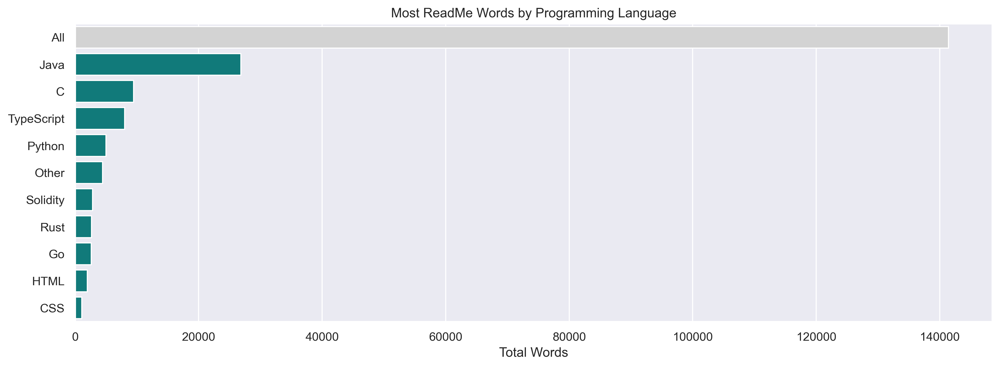

In [1438]:
# visualizing the language and word total word counts

plt.figure(figsize = (15, 5))

colors = ["lightgrey" if x == "All" else "darkcyan" for x in count_df["language"]]

ax = sns.barplot(
    x = count_df["word_count"],
    y = count_df["language"],
    palette = colors)

plt.ylabel(None)
plt.xlabel("Total Words")
plt.title("Most ReadMe Words by Programming Language")

plt.show()

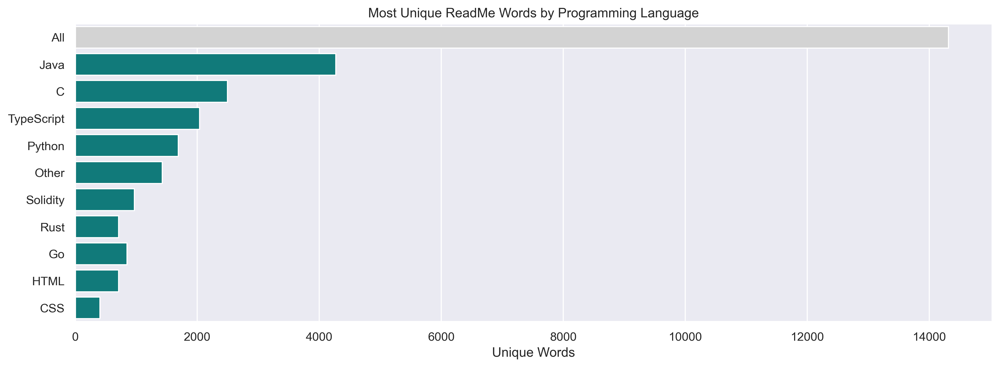

In [1439]:
# visualizing total number of unique words by language

plt.figure(figsize = (15, 5))

colors = ["lightgrey" if x == "All" else "darkcyan" for x in count_df["language"]]

ax = sns.barplot(
    x = count_df["unique_words"],
    y = count_df["language"],
    palette = colors)

plt.ylabel(None)
plt.xlabel("Unique Words")
plt.title("Most Unique ReadMe Words by Programming Language")

plt.show()

In [1440]:
# extracting word value counts by programming language README contents

C_freq = pd.Series(C_words, name = "C").value_counts()
css_freq = pd.Series(css_words, name = "CSS").value_counts()
go_freq = pd.Series(go_words, name = "Go").value_counts()
html_freq = pd.Series(html_words, name = "HTML").value_counts()
java_freq = pd.Series(java_words, name = "Java").value_counts()

other_freq = pd.Series(other_words, name = "Other").value_counts()
python_freq = pd.Series(python_words, name = "Python").value_counts()
rust_freq = pd.Series(rust_words, name = "Rust").value_counts()
solidity_freq = pd.Series(solidity_words, name = "Solidity").value_counts()
typescript_freq = pd.Series(typescript_words, name = "TypeScript").value_counts()

all_freq = pd.Series(all_words, name = "all").value_counts()

In [1441]:
# mass frequency dataframe

mass_count = (pd.concat([
                all_freq, 
                C_freq,
                css_freq,
                go_freq,
                html_freq,
                java_freq, 
                other_freq,
                python_freq, 
                rust_freq,
                solidity_freq,
                typescript_freq], axis = 1, sort = True)
                    .set_axis(["all", "C", "CSS", "Go", "HTML", "Java", "Other", "Python", "Rust", "Solidity", "TypeScript"], axis = 1)
                    .fillna(False)
                    .apply(lambda s: s.astype(int)))

mass_count.sort_values(by = "all", ascending = False).head(25)

,all,C,CSS,Go,HTML,Java,Other,Python,Rust,Solidity,TypeScript
href,2116,27,1,0,0,95,6,29,1,0,43
detail,2004,26,3,5,0,14,1,3,0,2,9
summary,1951,12,0,0,0,3,2,2,0,0,0
git,1211,46,1,6,5,61,9,5,0,0,15
open,1022,54,6,1,14,98,14,7,8,6,33
project,993,80,5,4,3,155,10,24,6,8,57
13,975,1,0,0,0,1,1,1,0,0,0
2022,835,4,0,0,1,24,3,9,0,0,2
img,815,60,10,5,12,122,7,31,23,0,61
www,797,50,28,1,30,55,32,11,3,15,35


In [1442]:
len(all_words)

141419

In [1443]:
# what about cleaning for "single" numerical values? (e.g., "0", "2", etc.)

def remove_nums(list):
    # pattern to search for
    pattern = '[0-9]'

    # creating the new list with removed numerical elements
    new_list = [re.sub(pattern, '', ele) for ele in list]

    # removing any word/ele <= 2 letters
    new_list = [re.sub(r'\b[a-z]{,2}\b', '', ele) for ele in new_list]
    
    # removing empty strings
    new_list = [ele for ele in new_list if ele]

    # return new list of accepted elements
    return new_list


test = remove_nums(all_words)

print(f'total words in test: {len(test)}')
print('percent change after clean: {:.2f}'.format((len(all_words)-len(test))/len(test)))

total words in test: 123073
percent change after clean: 0.15


In [1444]:
# applying function to word dfs

all_words = remove_nums(all_words)
C_words = remove_nums(C_words)
css_words = remove_nums(css_words)
go_words = remove_nums(go_words)
html_words = remove_nums(html_words)
java_words = remove_nums(java_words)
other_words = remove_nums(other_words)
python_words = remove_nums(python_words)
rust_words = remove_nums(rust_words)
solidity_words = remove_nums(solidity_words)
typescript_words = remove_nums(typescript_words)

In [1445]:
# updating the word value counts by programming language README contents

C_freq = pd.Series(C_words, name = "C").value_counts()
css_freq = pd.Series(css_words, name = "CSS").value_counts()
go_freq = pd.Series(go_words, name = "Go").value_counts()
html_freq = pd.Series(html_words, name = "HTML").value_counts()
java_freq = pd.Series(java_words, name = "Java").value_counts()

other_freq = pd.Series(other_words, name = "Other").value_counts()
python_freq = pd.Series(python_words, name = "Python").value_counts()
rust_freq = pd.Series(rust_words, name = "Rust").value_counts()
solidity_freq = pd.Series(solidity_words, name = "Solidity").value_counts()
typescript_freq = pd.Series(typescript_words, name = "TypeScript").value_counts()

all_freq = pd.Series(all_words, name = "all").value_counts()

In [1446]:
# updating frequency dataframe

mass_count = (pd.concat([
                all_freq, 
                C_freq,
                css_freq,
                go_freq,
                html_freq,
                java_freq, 
                other_freq,
                python_freq, 
                rust_freq,
                solidity_freq,
                typescript_freq], axis = 1, sort = True)
                    .set_axis(["all", "C", "CSS", "Go", "HTML", "Java", "Other", "Python", "Rust", "Solidity", "TypeScript"], axis = 1)
                    .fillna(False)
                    .apply(lambda s: s.astype(int)))

mass_count.sort_values(by = "all", ascending = False).head(50)

mass_count.to_csv("/Users/mijailmariano/Desktop/mass_count.csv")

In [1447]:
# testing out the groupby method for top 20 words

top_20 = mass_count.sort_values("all", ascending = False).head(20)

df_grouped = top_20.groupby(top_20.index)[["all", "C", "CSS", "Go", "HTML", "Java", "Other", "Python", "Rust", "Solidity", "TypeScript"]].mean().sort_values(by = "all", ascending = False)

df_grouped

,all,C,CSS,Go,HTML,Java,Other,Python,Rust,Solidity,TypeScript
href,2116.0,27.0,1.0,0.0,0.0,95.0,6.0,29.0,1.0,0.0,43.0
detail,2004.0,26.0,3.0,5.0,0.0,14.0,1.0,3.0,0.0,2.0,9.0
summary,1951.0,12.0,0.0,0.0,0.0,3.0,2.0,2.0,0.0,0.0,0.0
git,1211.0,46.0,1.0,6.0,5.0,61.0,9.0,5.0,0.0,0.0,15.0
open,1022.0,54.0,6.0,1.0,14.0,98.0,14.0,7.0,8.0,6.0,33.0
project,993.0,80.0,5.0,4.0,3.0,155.0,10.0,24.0,6.0,8.0,57.0
img,815.0,60.0,10.0,5.0,12.0,122.0,7.0,31.0,23.0,0.0,61.0
www,797.0,50.0,28.0,1.0,30.0,55.0,32.0,11.0,3.0,15.0,35.0
app,732.0,9.0,14.0,10.0,0.0,554.0,6.0,0.0,1.0,0.0,72.0
clone,690.0,10.0,0.0,4.0,1.0,28.0,9.0,4.0,0.0,0.0,13.0


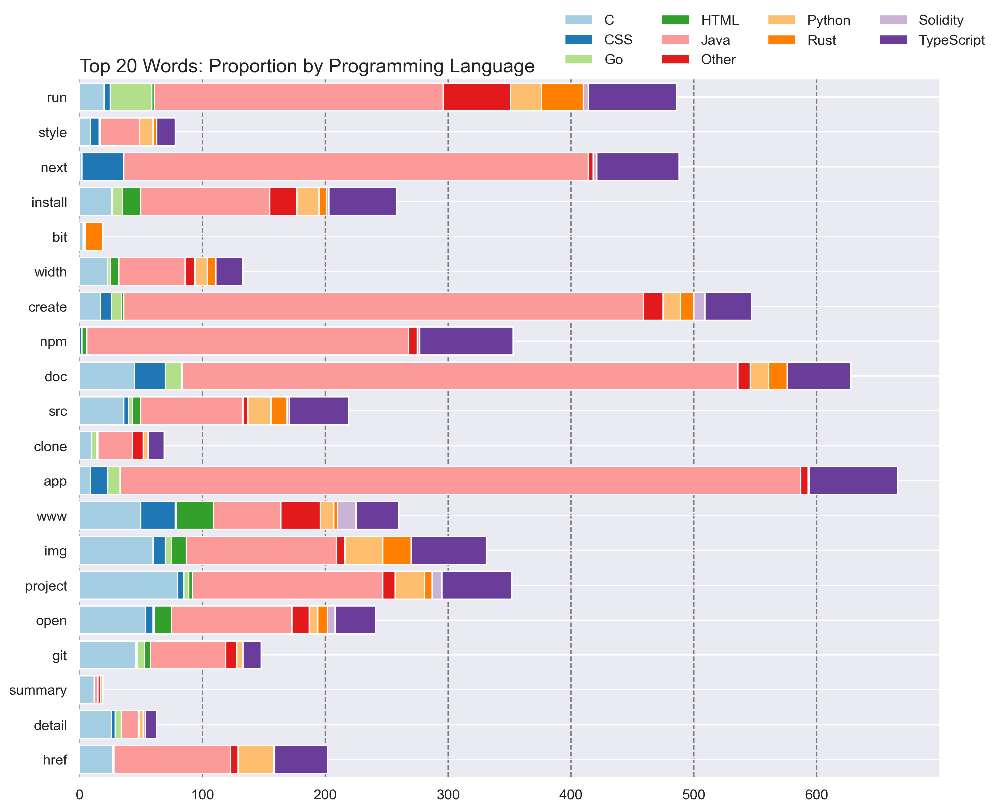

In [1448]:
languages = ["C", "CSS", "Go", "HTML", "Java", "Other", "Python", "Rust", "Solidity", "TypeScript"]
colors = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6','#6a3d9a']
words = df_grouped.index.tolist()

# figure and axis
fig, ax = plt.subplots(1, figsize = (12, 10))

# plot bars
left = len(df_grouped) * [0]

for idx, name in enumerate(languages):

    plt.barh(df_grouped.index, df_grouped[name], left = left, color = colors[idx])
    left = left + df_grouped[name]

# title, legend, words
plt.title('Top 20 Words: Proportion by Programming Language', loc='left', fontsize = 15)
plt.legend(languages, bbox_to_anchor=([0.55, 1, 0, 0]), ncol=4, frameon=False)
plt.xlabel('')

# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# adjust limits and draw grid lines
plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
ax.set_axisbelow(True)
ax.xaxis.grid(color = 'gray', linestyle = 'dashed')

plt.show()

----
#### ``3. (out of order, but it's ok!) Do different programming languages use a different number of unique words?``

#### ``Bigrams: Top 25 most Frequent Bigrams by Programming Language``

In [1449]:
# creating a language variable to iterate through and plot bigrams/trigrams
languages = train["language"].sort_values().unique().tolist()
languages.insert(0, "All Words")
languages

['All Words',
 'C',
 'CSS',
 'Go',
 'HTML',
 'Java',
 'Other',
 'Python',
 'Rust',
 'Solidity',
 'TypeScript',
 'nan']

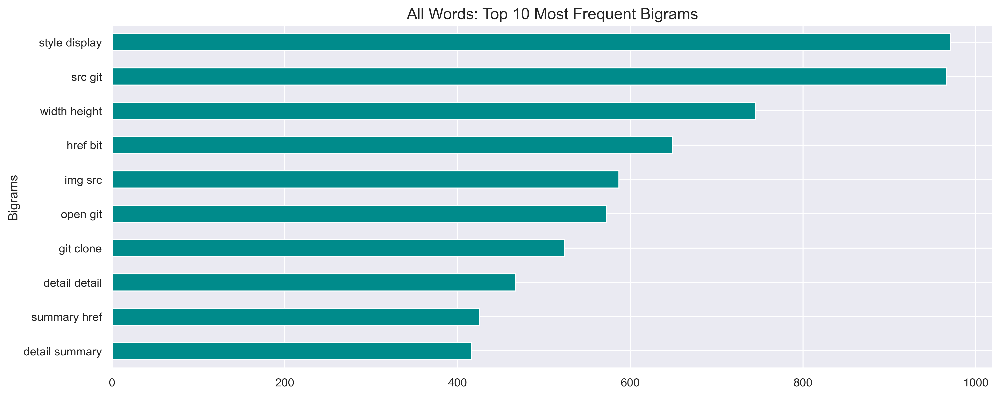

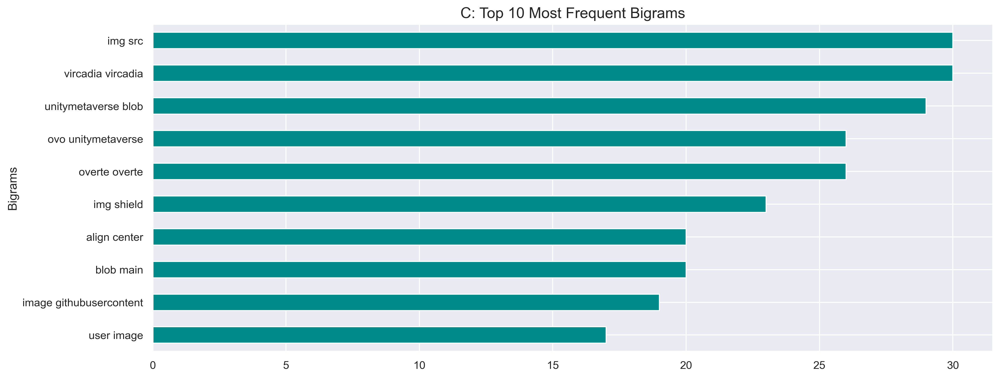

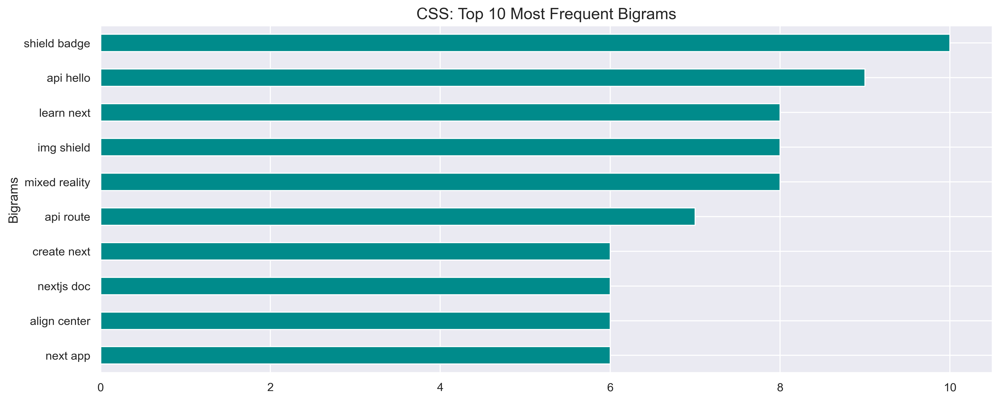

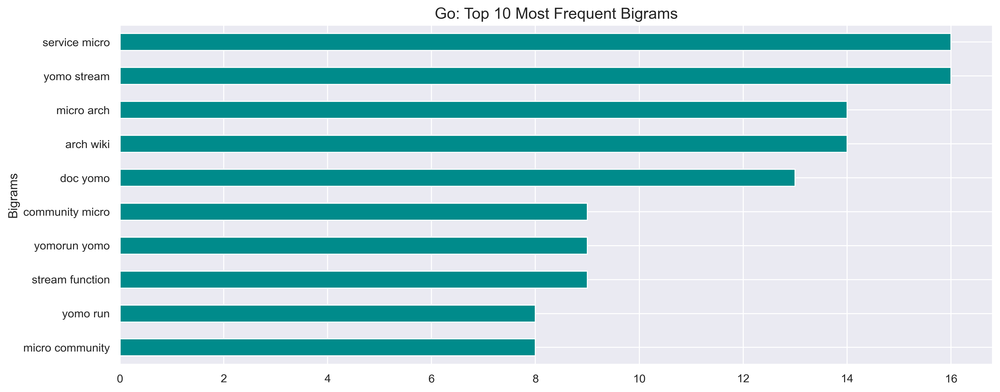

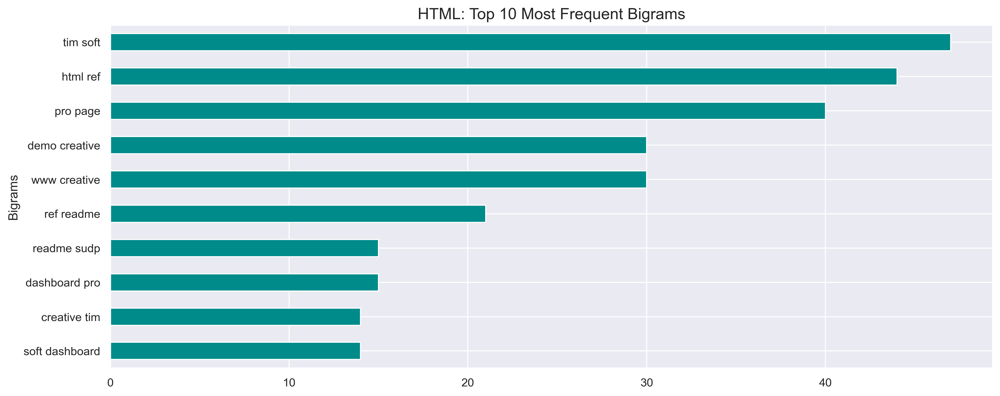

...

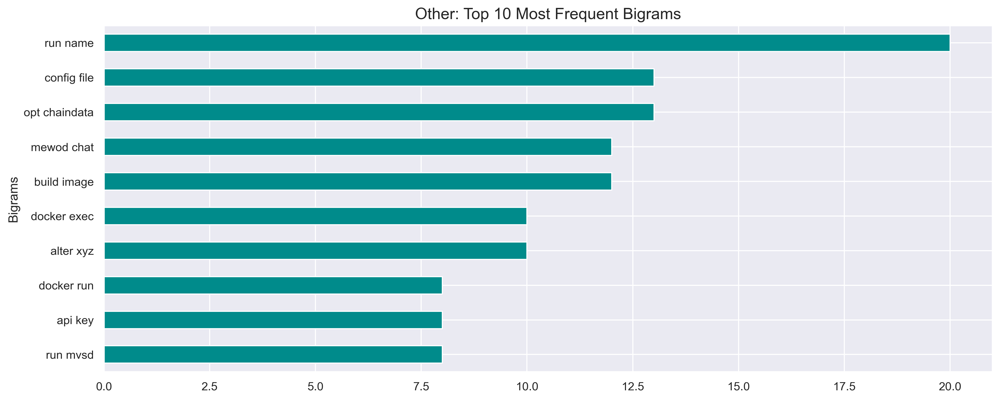

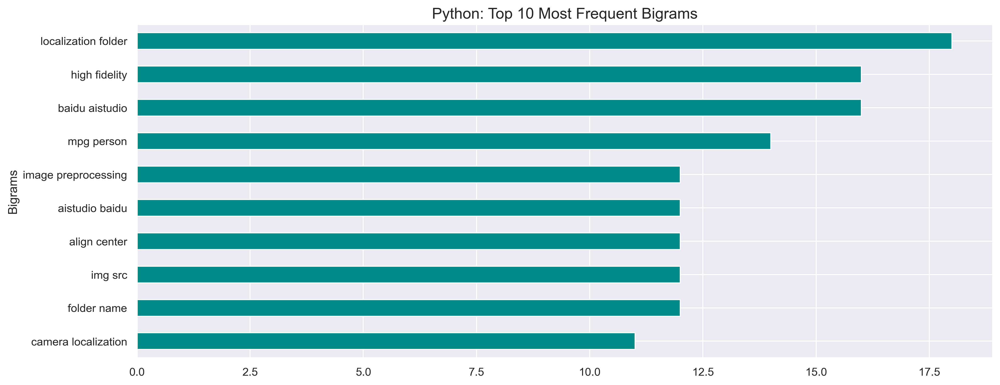

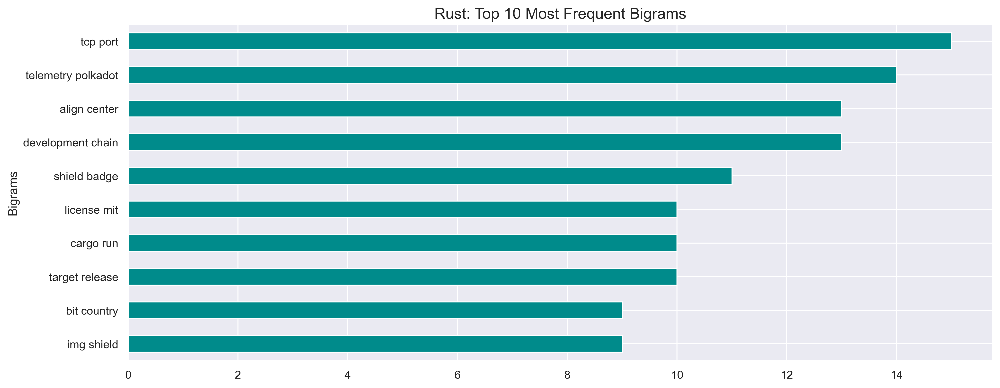

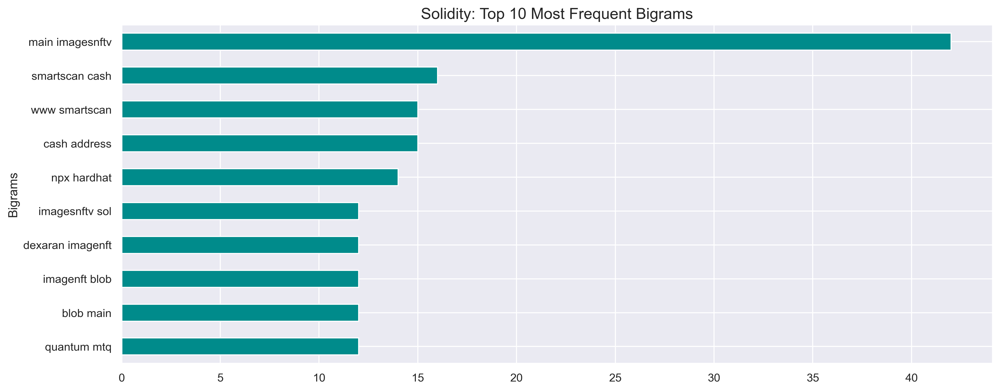

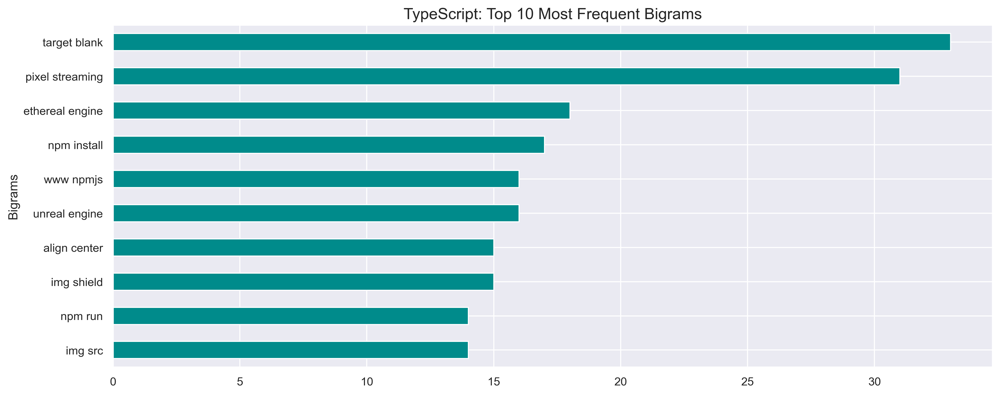

In [1450]:
# visualizing bigrams by programming language

frames = [
        all_words, 
        C_words, 
        css_words, 
        go_words, 
        html_words, 
        java_words, 
        other_words, 
        python_words, 
        rust_words, 
        solidity_words, 
        typescript_words]

counter = 0

for frame in frames:
    # creating the top 10 bigrams for ea. program language
    bigrams = (pd.Series(nltk.ngrams(frame, 2))
                .value_counts()
                .head(10))
    
    # sorting and plotting the bigrams
    bigrams.sort_values().plot.barh(figsize=(15, 6), color = "darkcyan")

    plt.title(f'{languages[counter]}: Top 10 Most Frequent Bigrams', fontsize = 15)
    plt.ylabel('Bigrams')
    plt.xlabel(None)

    # cleaning the bigram labels
    ticks, _ = plt.yticks()
    labels = bigrams.reset_index()['index'].apply(lambda t: t[0] + ' ' + t[1])
    _ = plt.yticks(ticks, labels)

    # update counter 
    counter += 1

    plt.show()

In [1451]:
# what about as a dataframe?

----
### ``Trigrams: Top 10 most Frequent Trigrams by Programming Language``

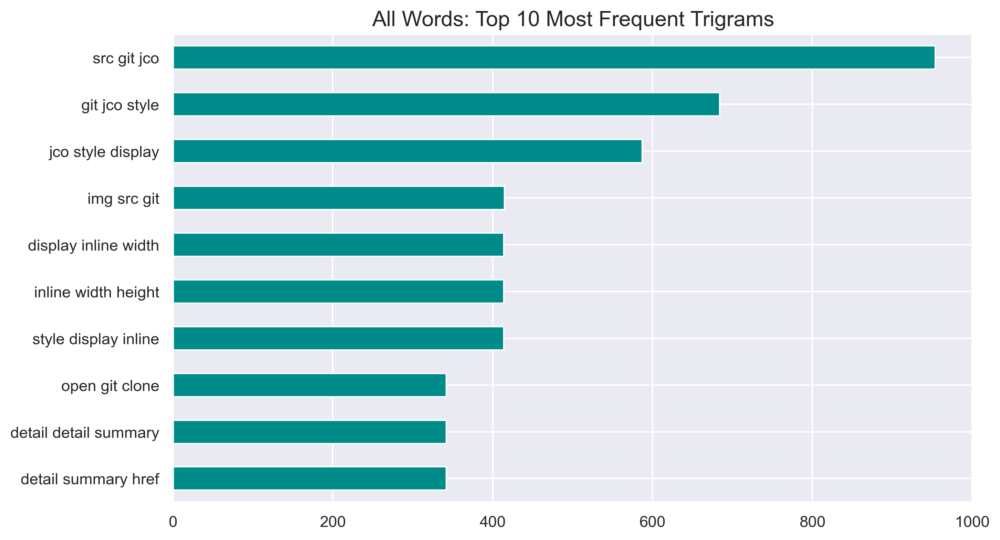

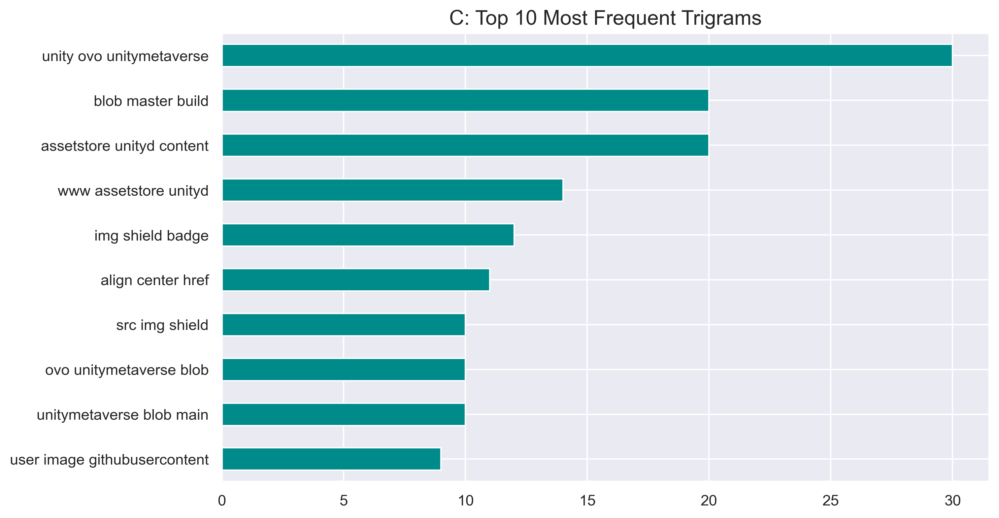

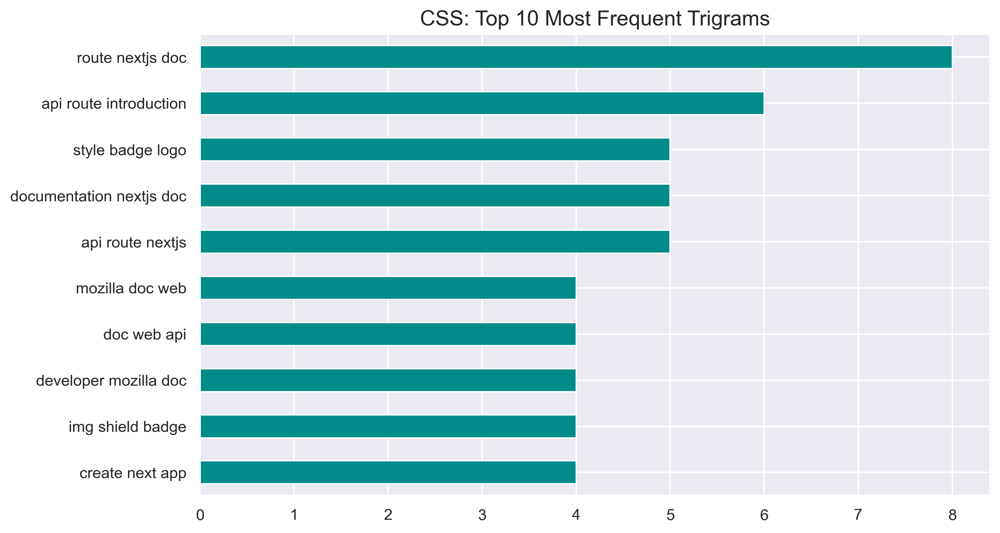

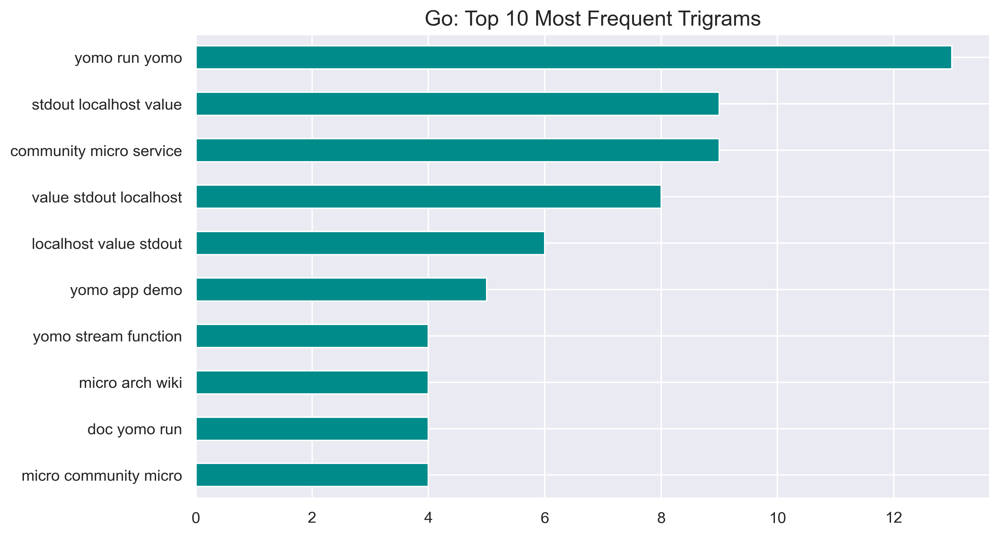

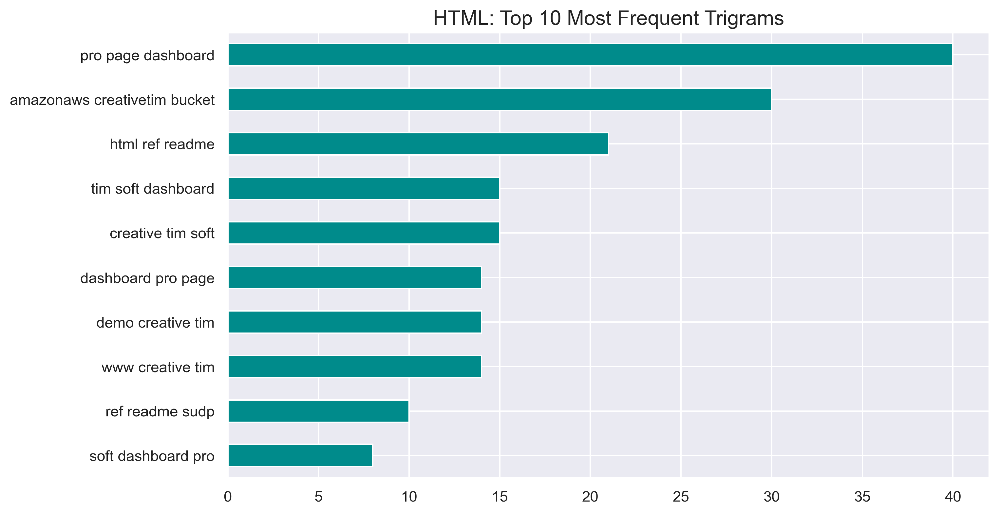

...

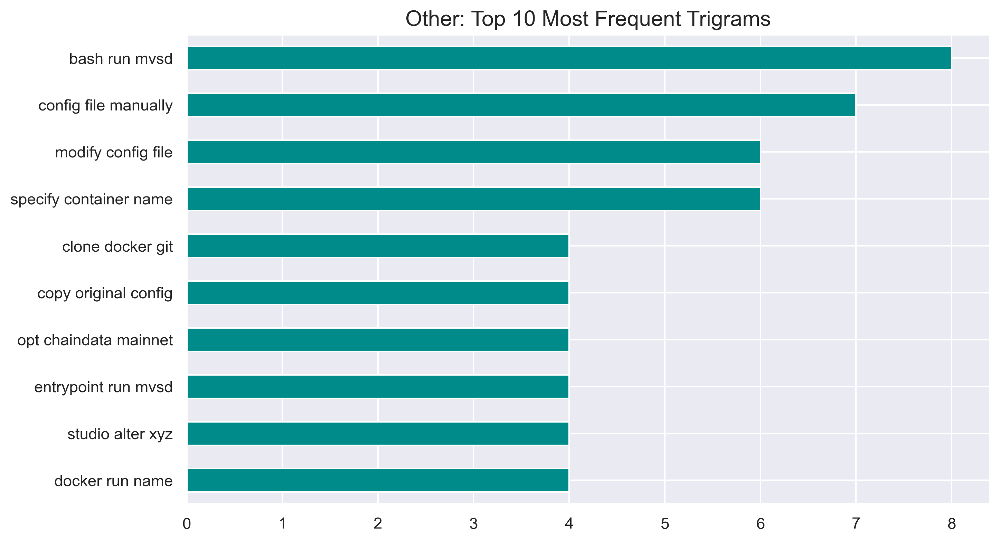

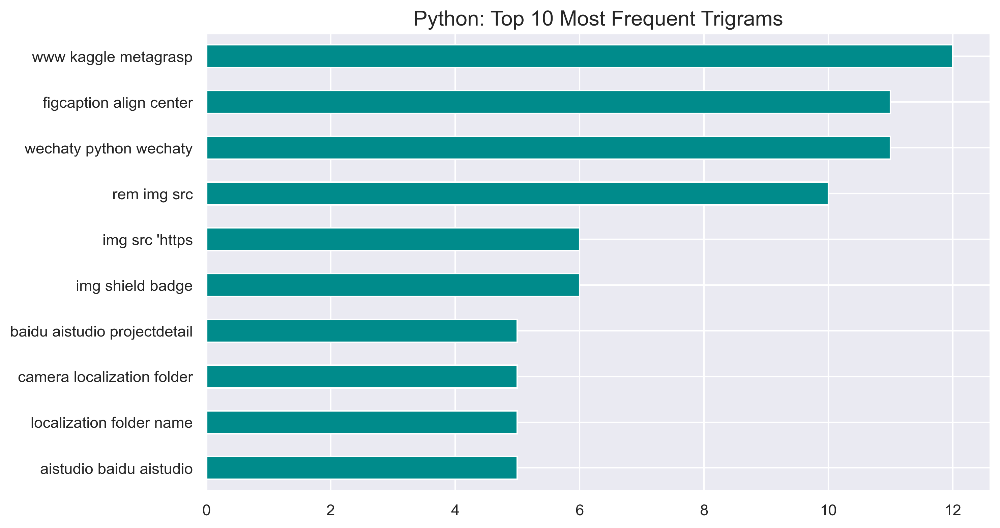

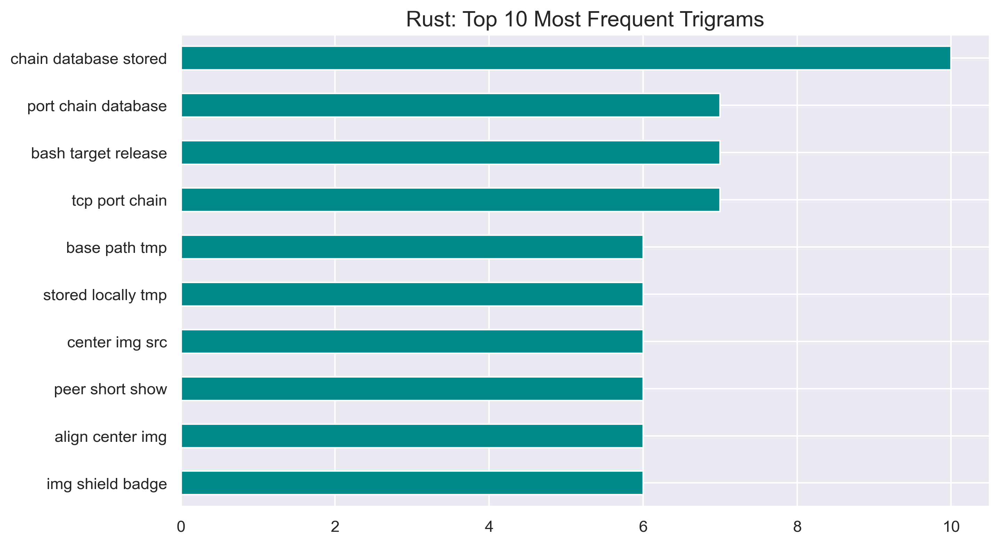

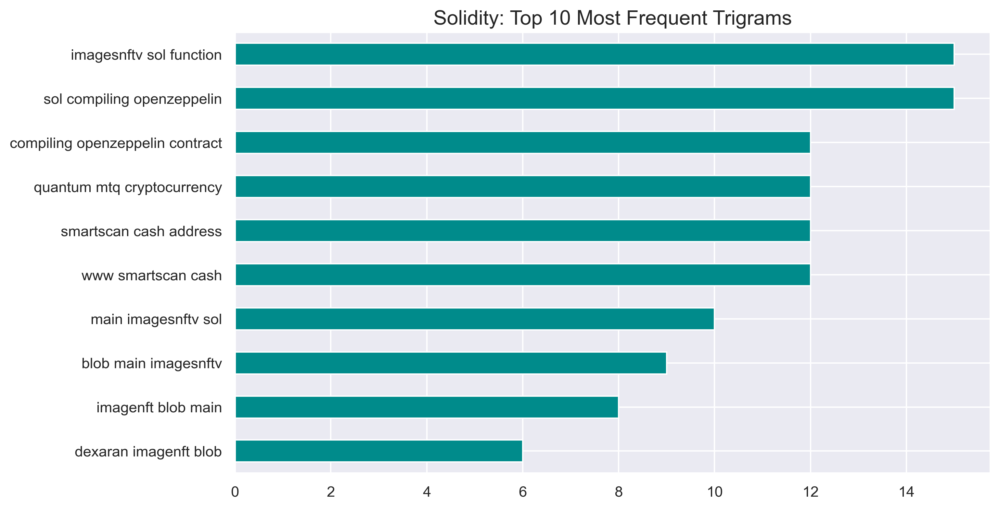

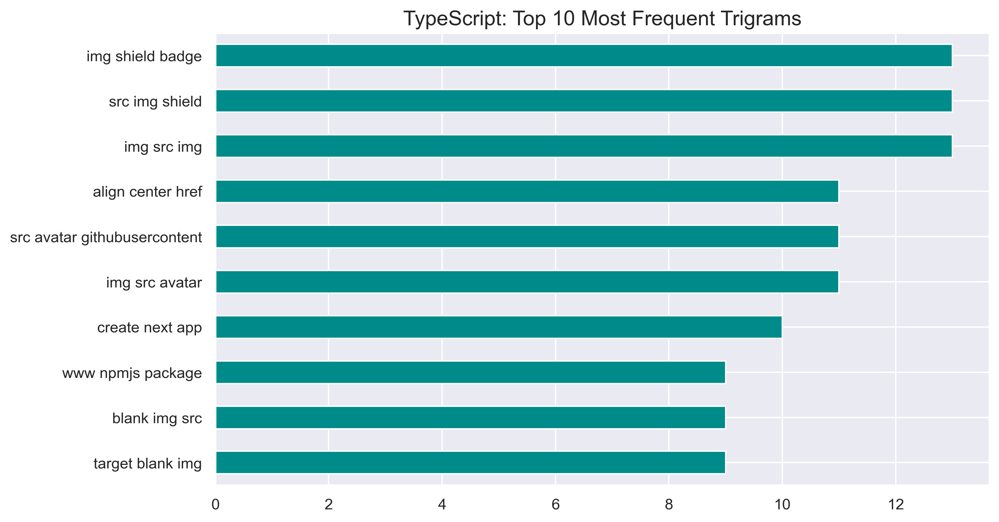

In [1452]:
# what about trigrams?
# visualizing trigrams by programming language

frames = [
        all_words, 
        C_words, 
        css_words, 
        go_words, 
        html_words, 
        java_words, 
        other_words, 
        python_words, 
        rust_words, 
        solidity_words, 
        typescript_words]

counter = 0

for frame in frames:
    # creating the top 10 trigrams for ea. program language
    trigrams = (pd.Series(nltk.ngrams(frame, 3))
                .value_counts()
                .head(10))

    # sorting and plotting the trigrams
    trigrams.sort_values().plot.barh(figsize=(10, 6), color = "darkcyan")

    plt.title(f'{languages[counter]}: Top 10 Most Frequent Trigrams', fontsize = 15)
    plt.ylabel(None)
    plt.xlabel(None)

    # cleaning the labels
    ticks, _ = plt.yticks()
    labels = trigrams.reset_index()['index'].apply(lambda t: t[0] + ' ' + t[1] + ' ' + t[2])
    _ = plt.yticks(ticks, labels)

    # update counter 
    counter += 1

    plt.show()

In [1453]:
# what about as a dataframe?

----
### ``Word Clouds``

In [1454]:
# creating datasets of mass repo text

C_words = (" ".join(train[train["language"] == "C"]["readme_contents"]))
css_words = (" ".join(train[train["language"] == "CSS"]["readme_contents"]))

go_words = (" ".join(train[train["language"] == "Go"]["readme_contents"]))
html_words = (" ".join(train[train["language"] == "HTML"]["readme_contents"]))

java_words = (" ".join(train[train["language"] == "Java"]["readme_contents"]))
other_words = (" ".join(train[train["language"] == "Other"]["readme_contents"]))

python_words = (" ".join(train[train["language"] == "Python"]["readme_contents"]))
rust_words = (" ".join(train[train["language"] == "Rust"]["readme_contents"]))

solidity_words = (" ".join(train[train["language"] == "Solidity"]["readme_contents"]))
typescript_words = (" ".join(train[train["language"] == "TypeScript"]["readme_contents"]))

all_words = (" ".join(train.readme_contents))

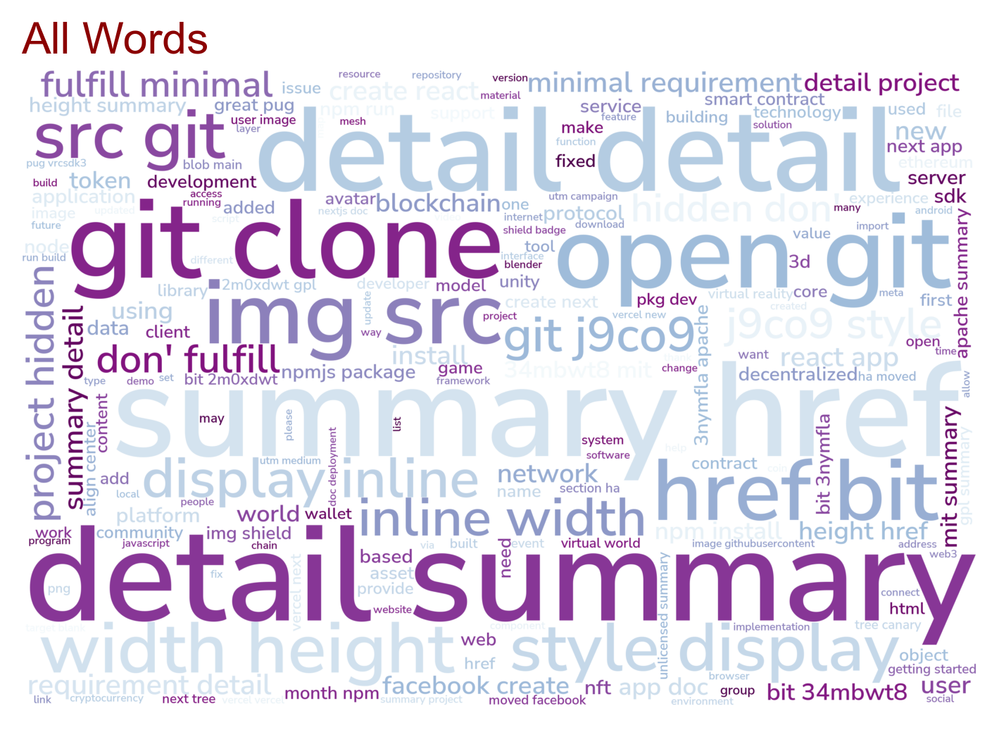

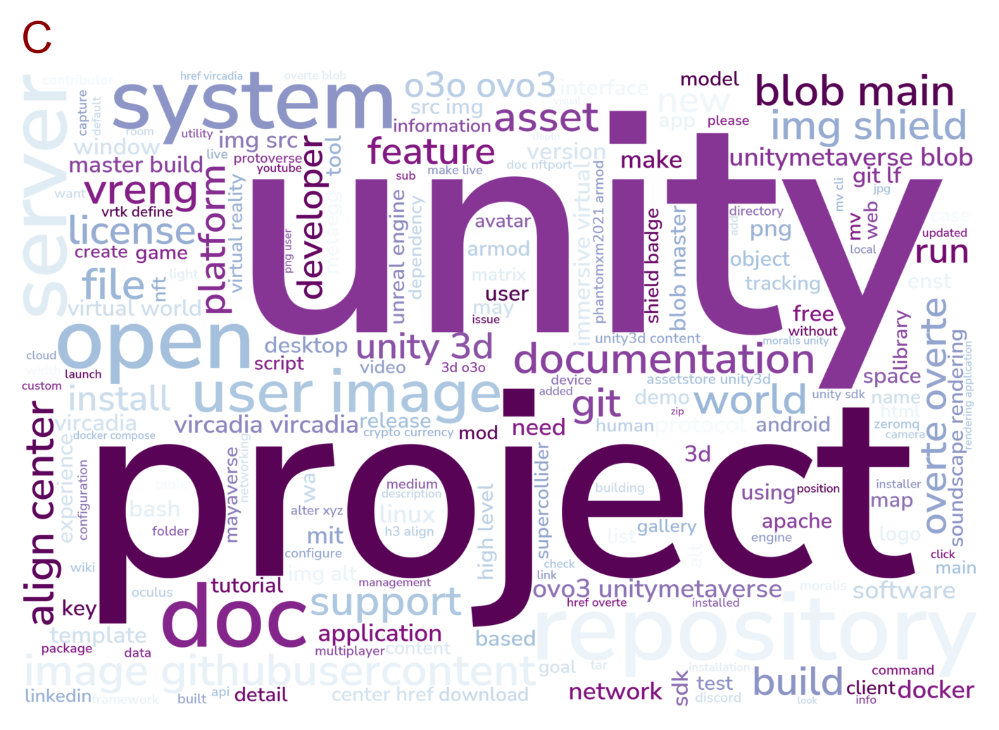

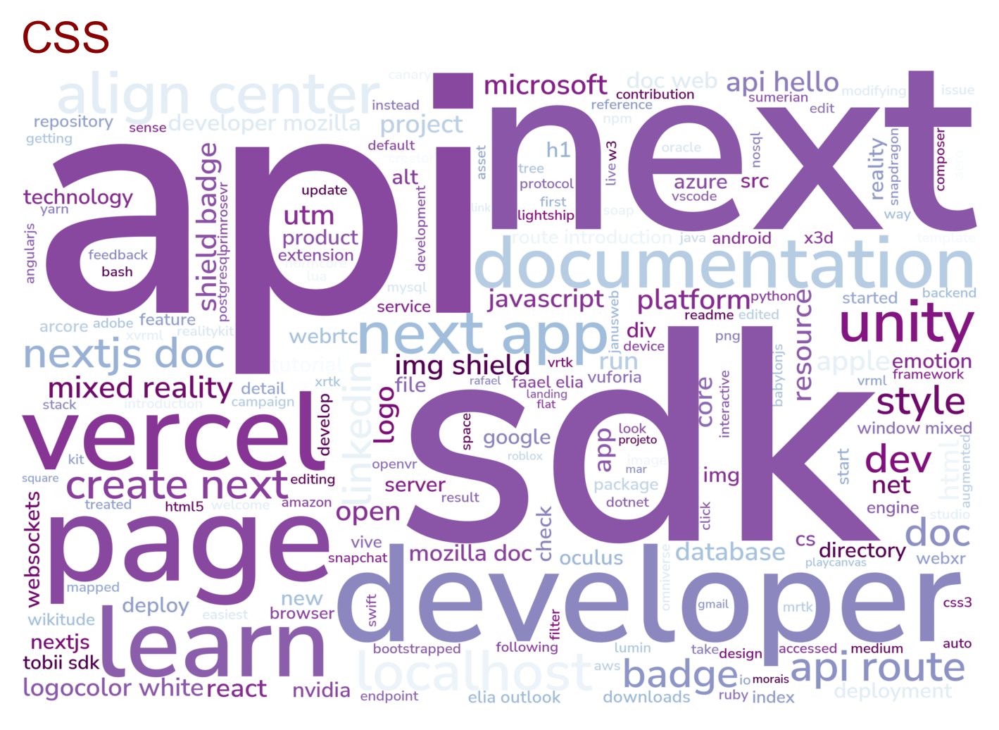

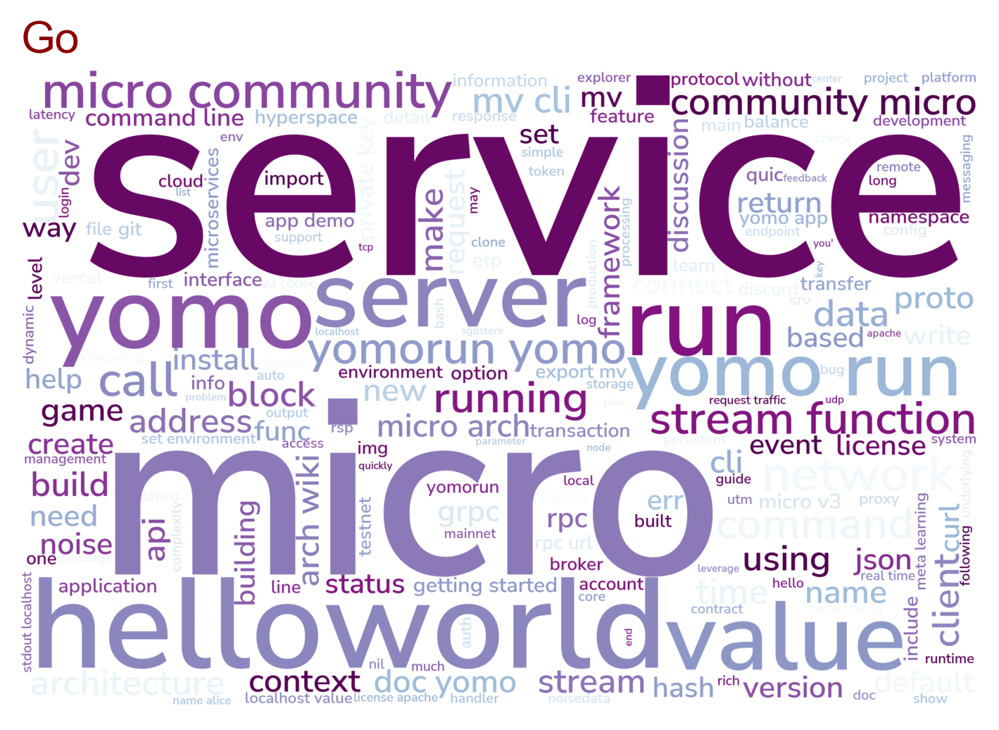

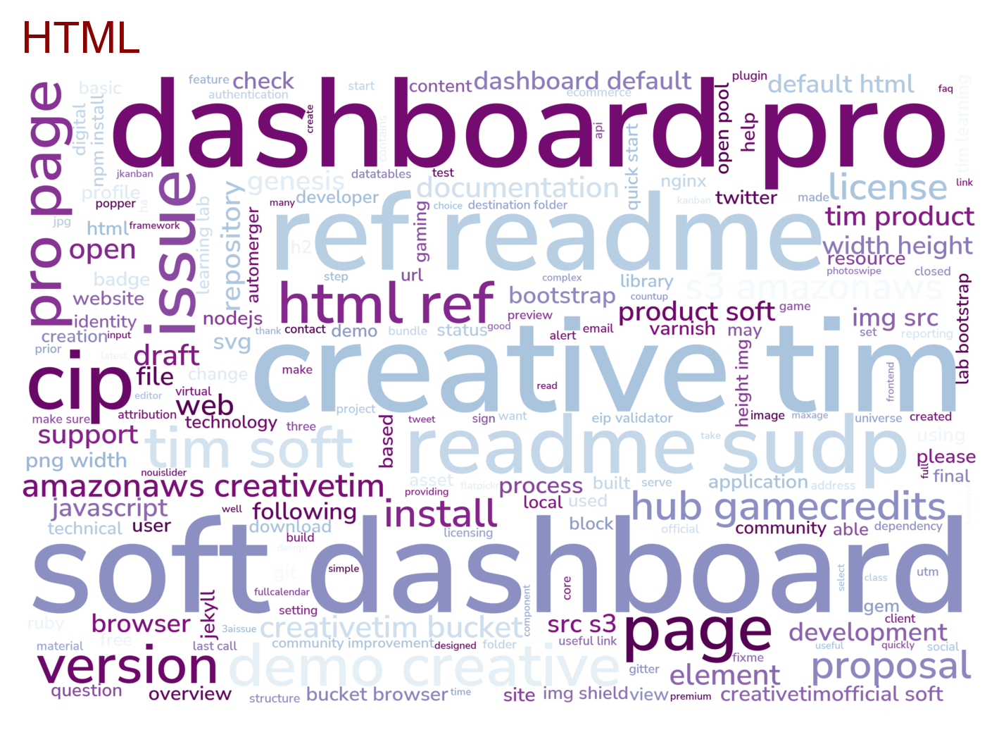

...

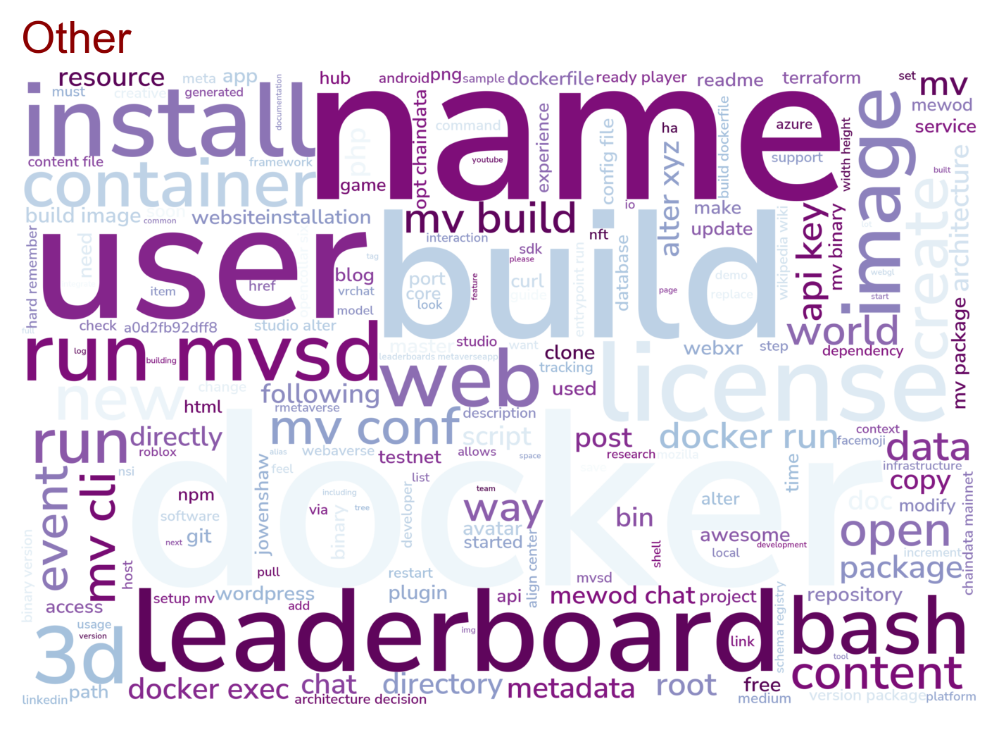

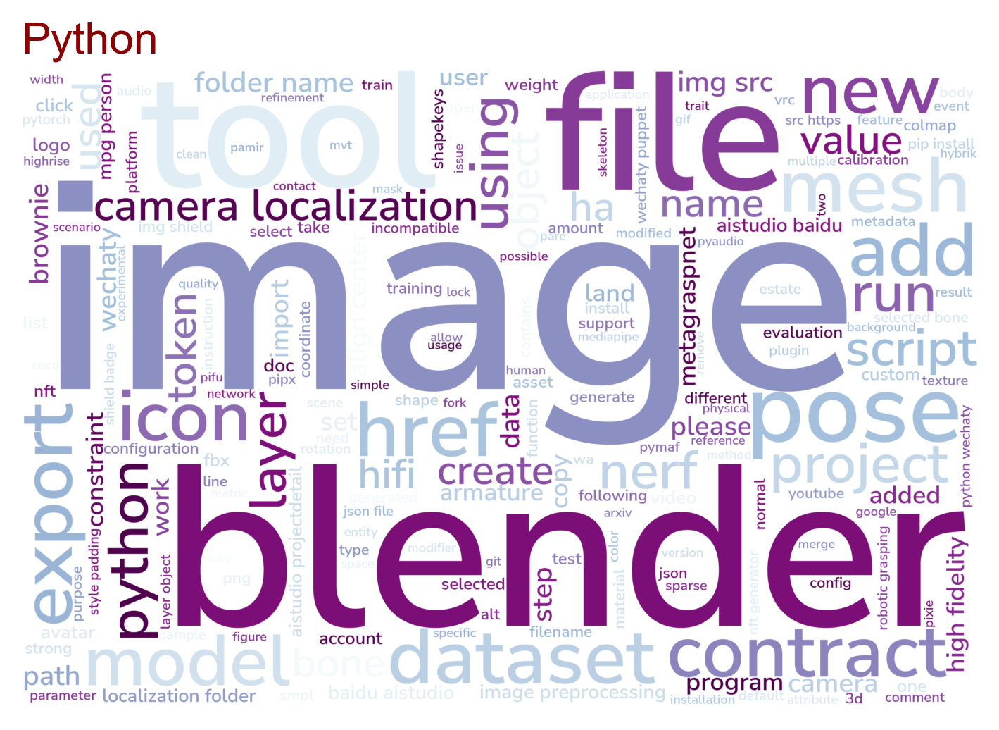

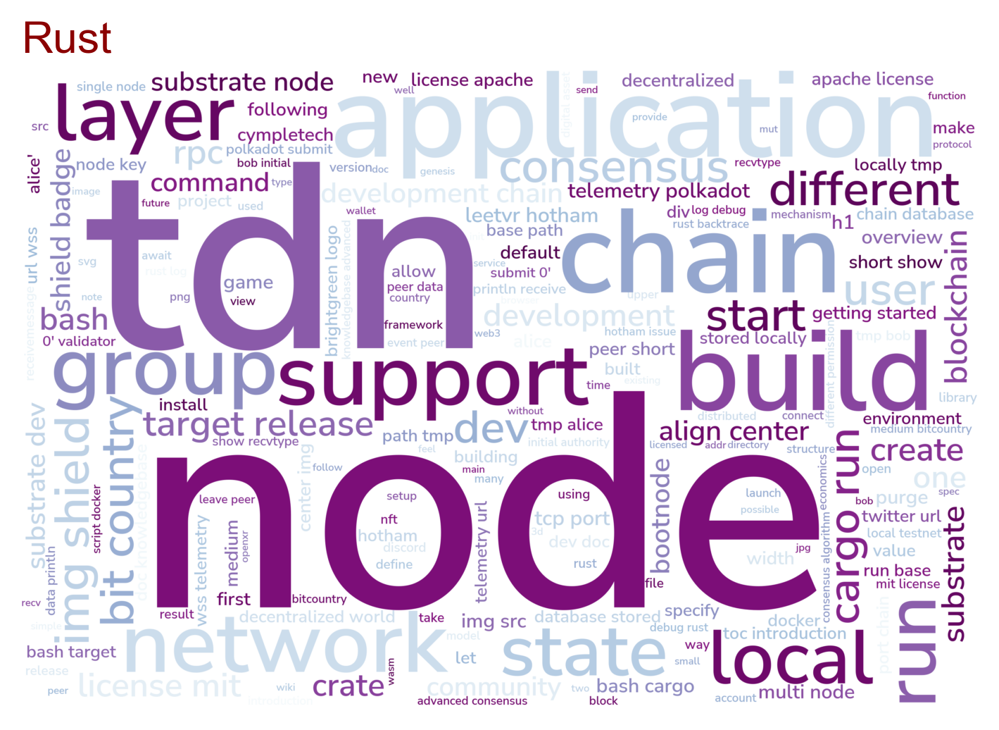

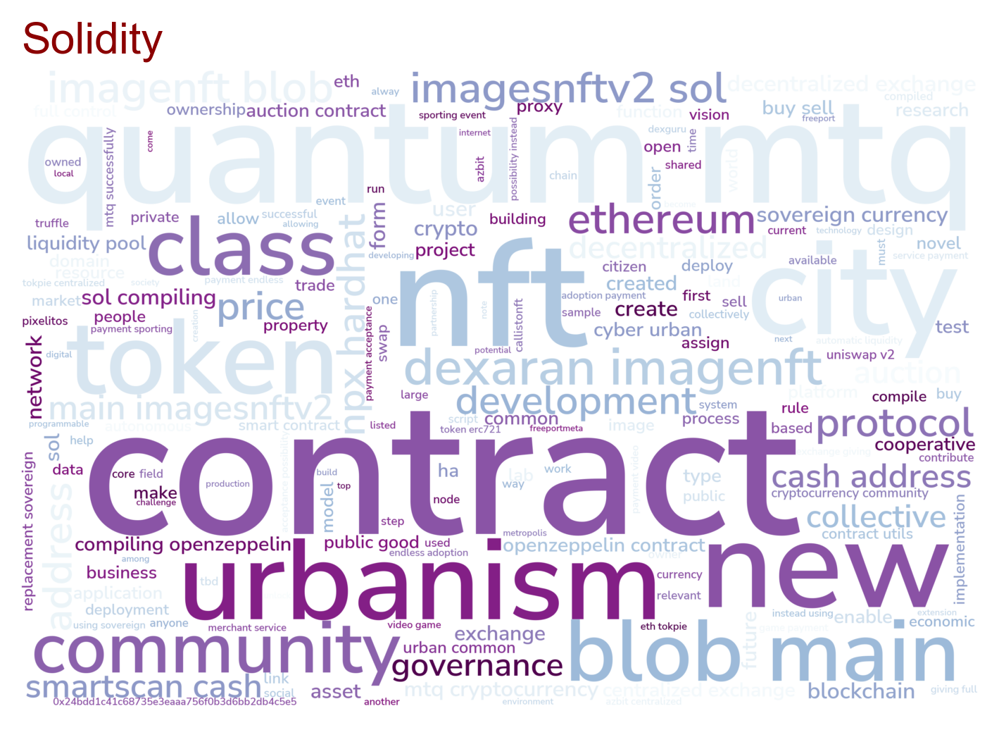

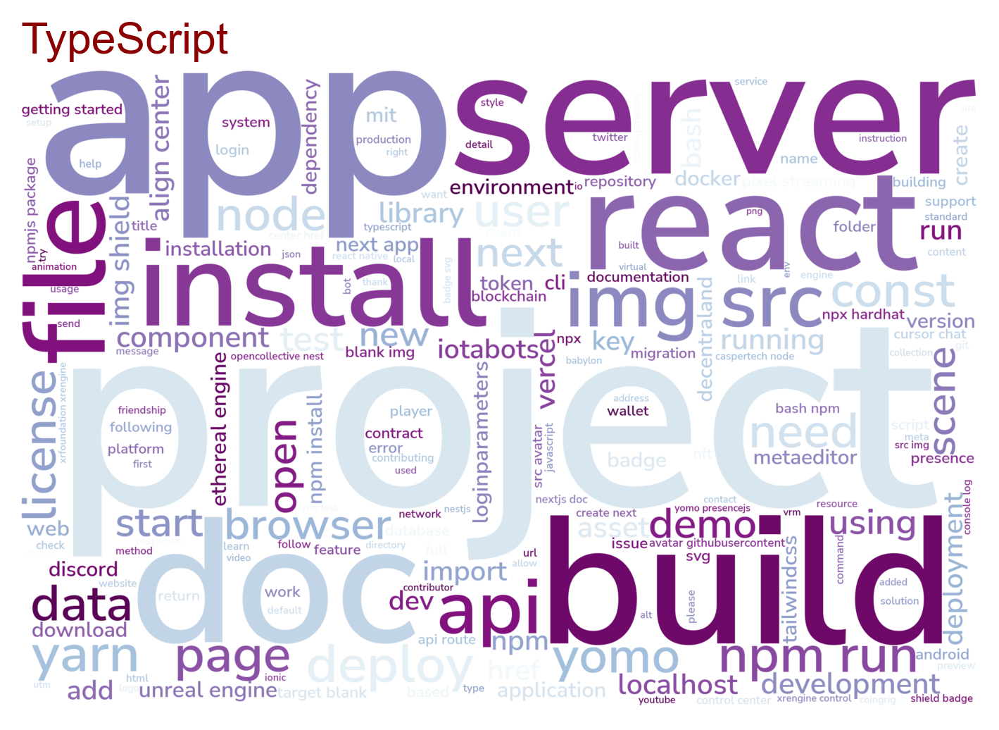

In [1476]:
# creating word cloud object and iterating through programming language frequency words

tfidf = TfidfVectorizer()
counter = 0

# change the value to black
def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")


frames = [
        all_words, 
        C_words, 
        css_words, 
        go_words, 
        html_words, 
        java_words, 
        other_words, 
        python_words, 
        rust_words, 
        solidity_words, 
        typescript_words]

for frame in frames:

    fg_color = "darkred"

    # creating the object
    # set the wordcloud background color to white
    # set max_words to 1000
    # set width and height to higher quality, 3000 x 2000
    wordcloud = WordCloud(font_path = '/Library/Fonts/NunitoSans-SemiBold.ttf', colormap = "BuPu_r", background_color = "white", width = 3000, height = 2000).generate(frame)

    # set the word color to black
    # wordcloud.recolor(color_func = black_color_func)

    plt.title(f'{languages[counter]}', fontsize = 15, loc = "left", color = fg_color)
    plt.imshow(wordcloud, interpolation = "bilinear")
    plt.axis("off")

    # update counter 
    counter += 1

    plt.savefig(f'/Users/mijailmariano/codeup-data-science/github_classification_project/wordclouds/word_cloud{counter}.jpeg')
    plt.show()

----
#### ``1. What are the most common words in READMEs?``


In [1456]:
languages 

['All Words',
 'C',
 'CSS',
 'Go',
 'HTML',
 'Java',
 'Other',
 'Python',
 'Rust',
 'Solidity',
 'TypeScript',
 'nan']

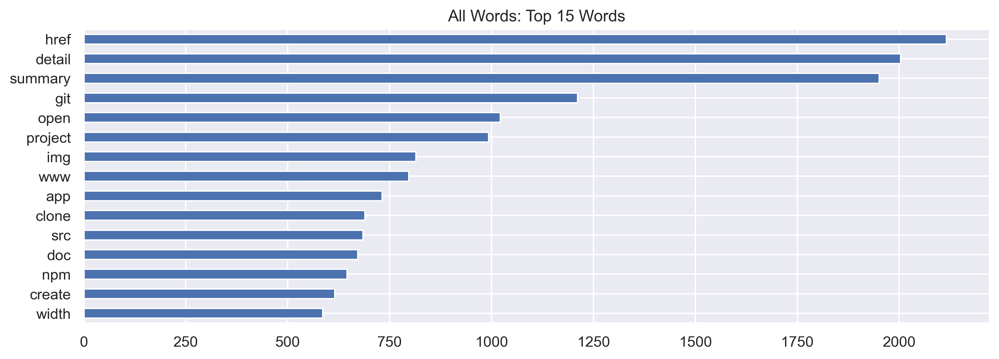

Language: All Words
Top 15 Words:
--------------------
href       2116
detail     2004
summary    1951
git        1211
open       1022
project     993
img         815
www         797
app         732
clone       690
src         685
doc         672
npm         646
create      616
width       586
Name: all, dtype: int64


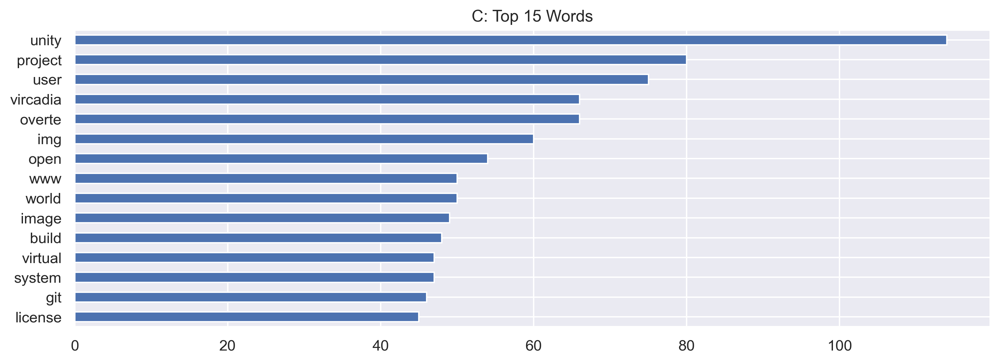

Language: C
Top 15 Words:
--------------------
unity       114
project      80
user         75
overte       66
vircadia     66
img          60
open         54
world        50
www          50
image        49
build        48
system       47
virtual      47
git          46
license      45
Name: C, dtype: int64


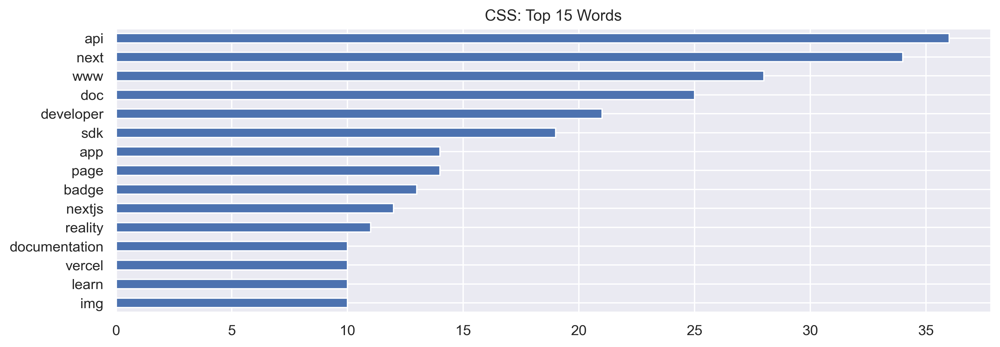

Language: CSS
Top 15 Words:
--------------------
api              36
next             34
www              28
doc              25
developer        21
sdk              19
page             14
app              14
badge            13
nextjs           12
reality          11
img              10
learn            10
vercel           10
documentation    10
Name: CSS, dtype: int64


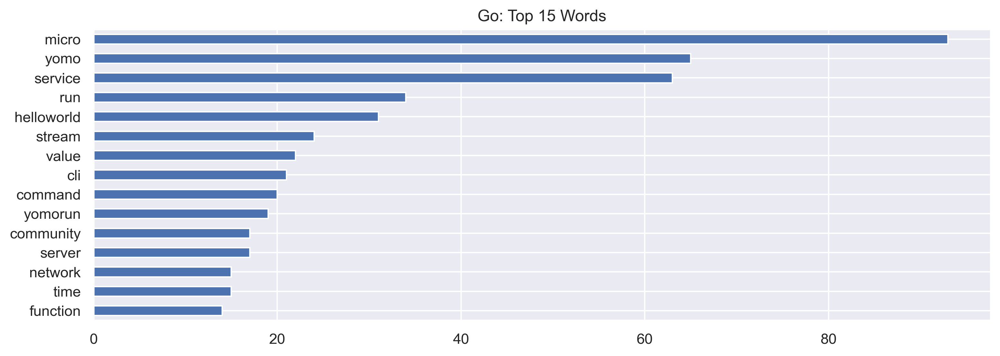

Language: Go
Top 15 Words:
--------------------
micro         93
yomo          65
service       63
run           34
helloworld    31
stream        24
value         22
cli           21
command       20
yomorun       19
server        17
community     17
time          15
network       15
function      14
Name: Go, dtype: int64


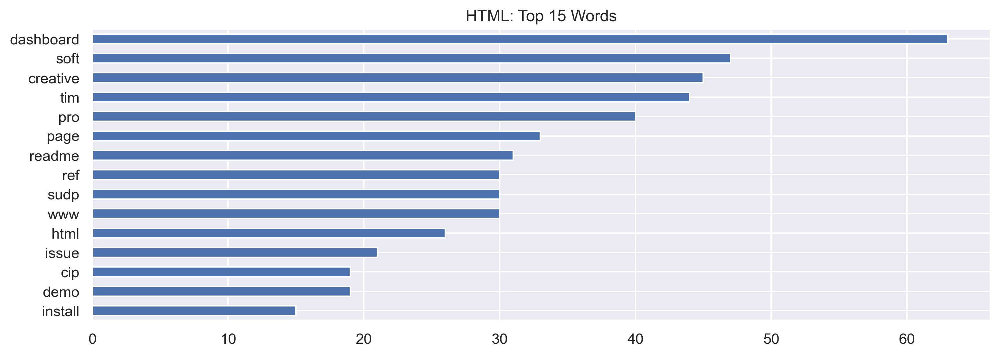

Language: HTML
Top 15 Words:
--------------------
dashboard    63
soft         47
creative     45
tim          44
pro          40
page         33
readme       31
www          30
sudp         30
ref          30
html         26
issue        21
demo         19
cip          19
install      15
Name: HTML, dtype: int64


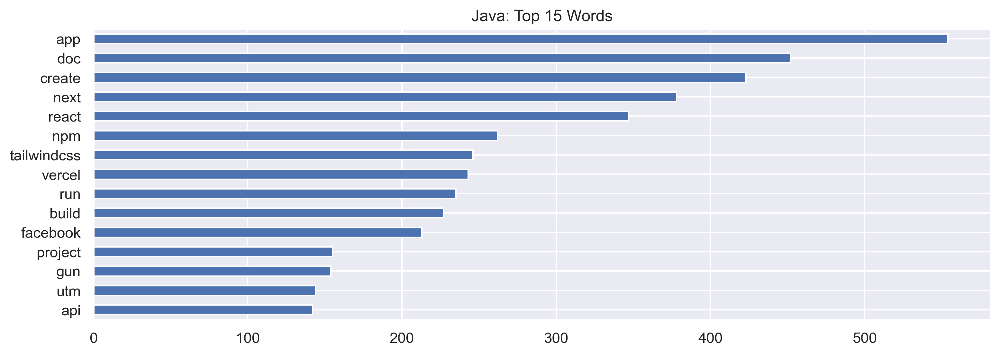

Language: Java
Top 15 Words:
--------------------
app            554
doc            452
create         423
next           378
react          347
npm            262
tailwindcss    246
vercel         243
run            235
build          227
facebook       213
project        155
gun            154
utm            144
api            142
Name: Java, dtype: int64


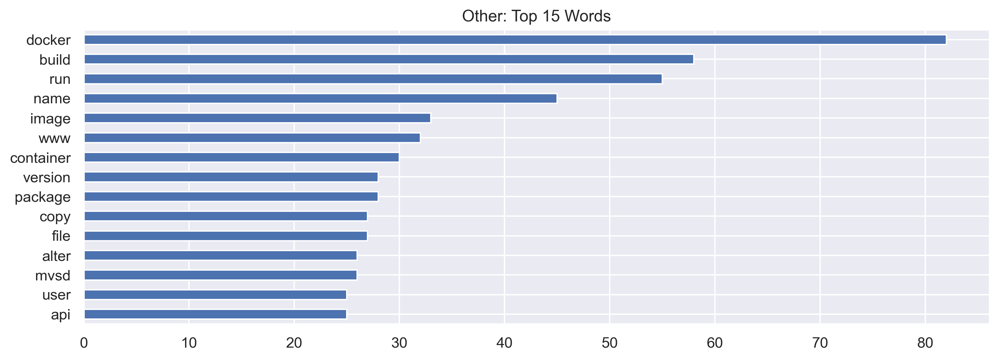

Language: Other
Top 15 Words:
--------------------
docker       82
build        58
run          55
name         45
image        33
www          32
container    30
package      28
version      28
file         27
copy         27
mvsd         26
alter        26
api          25
user         25
Name: Other, dtype: int64


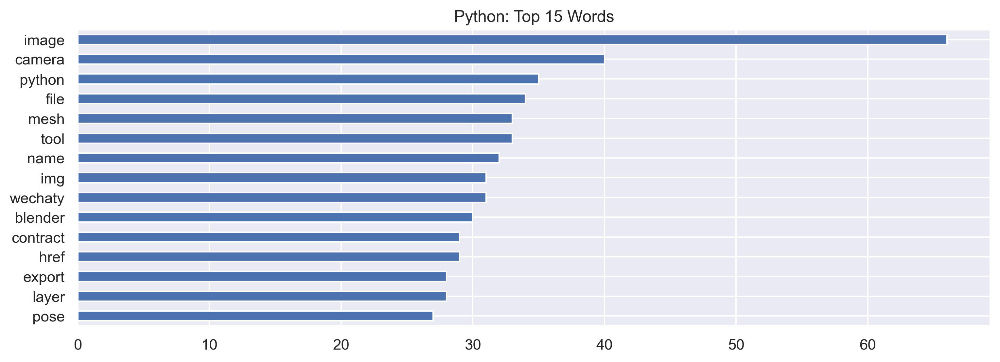

Language: Python
Top 15 Words:
--------------------
image       66
camera      40
python      35
file        34
tool        33
mesh        33
name        32
wechaty     31
img         31
blender     30
href        29
contract    29
layer       28
export      28
pose        27
Name: Python, dtype: int64


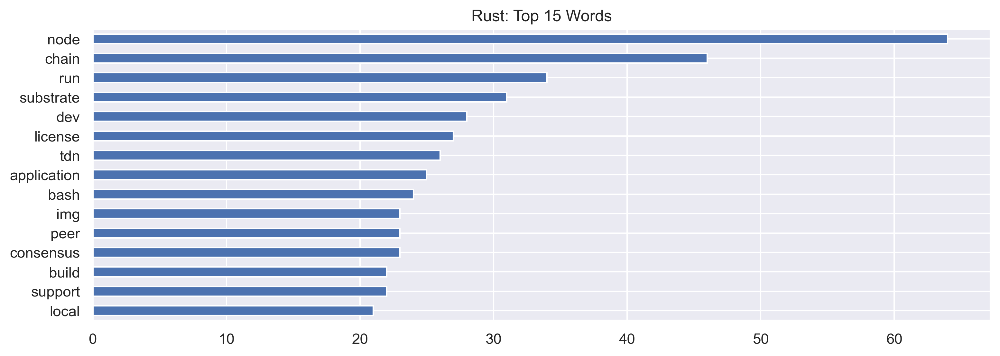

Language: Rust
Top 15 Words:
--------------------
node           64
chain          46
run            34
substrate      31
dev            28
license        27
tdn            26
application    25
bash           24
consensus      23
peer           23
img            23
support        22
build          22
local          21
Name: Rust, dtype: int64


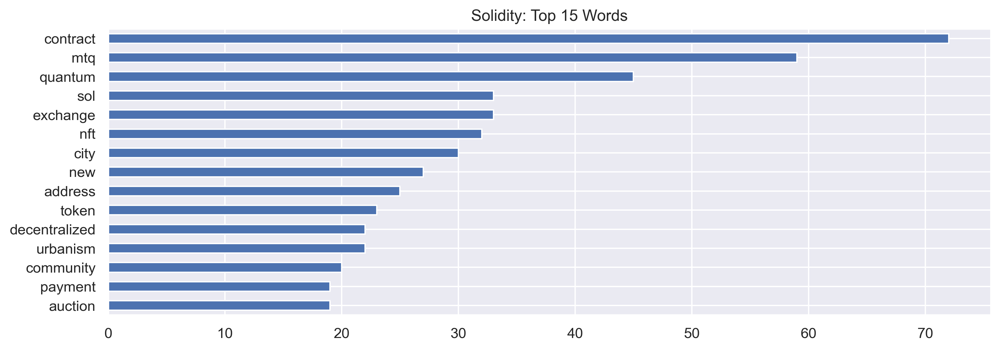

Language: Solidity
Top 15 Words:
--------------------
contract         72
mtq              59
quantum          45
exchange         33
sol              33
nft              32
city             30
new              27
address          25
token            23
urbanism         22
decentralized    22
community        20
auction          19
payment          19
Name: Solidity, dtype: int64


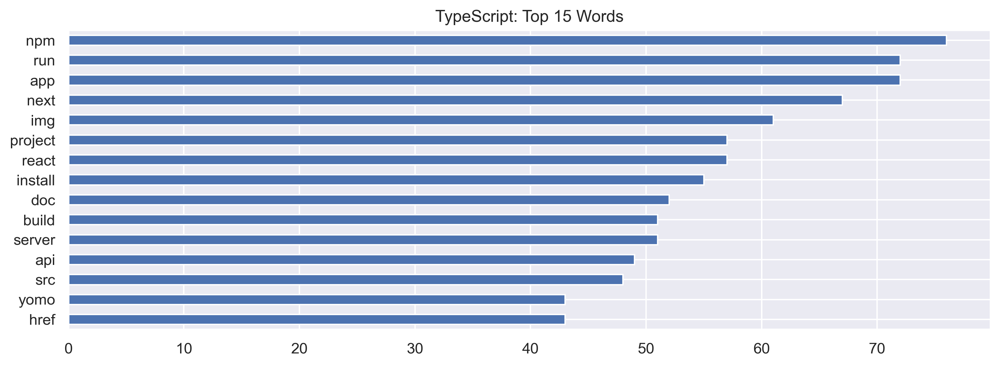

Language: TypeScript
Top 15 Words:
--------------------
npm        76
app        72
run        72
next       67
img        61
react      57
project    57
install    55
doc        52
server     51
build      51
api        49
src        48
href       43
yomo       43
Name: TypeScript, dtype: int64


In [1457]:
# for loop to return top words from ea. programming langugage

frames = [
    all_freq,
    C_freq,
    css_freq,
    go_freq,
    html_freq,
    java_freq, 
    other_freq,
    python_freq, 
    rust_freq,
    solidity_freq,
    typescript_freq
]

languages = [
            "All Words",
            'C',
            'CSS',
            'Go',
            'HTML',
            'Java',
            'Other',
            'Python',
            'Rust',
            'Solidity',
            'TypeScript']

def get_top_words(frames, languages, number_of_words):

    for i in range(len(frames)):
        plt.figure(figsize = (12, 4))

        frame = frames[i]

        top_words = frame.head(number_of_words)
        top_words.sort_values(ascending = True).plot.barh()
        plt.title(f'{languages[i]}: Top {number_of_words} Words')

        plt.show()

        print(f'Language: {languages[i]}')
        print(f'Top {number_of_words} Words:\n--------------------\n{top_words}')


get_top_words(frames, languages, 15)

----
#### ``2. Does the length of the README vary by programming language?``

**Yes, the average length of Metaverse repositories differs by programming language. On average, the following primary programming languages tend to contain more text/content in their README files:**

- 1. Go
- 2. Python
- 3. Rust


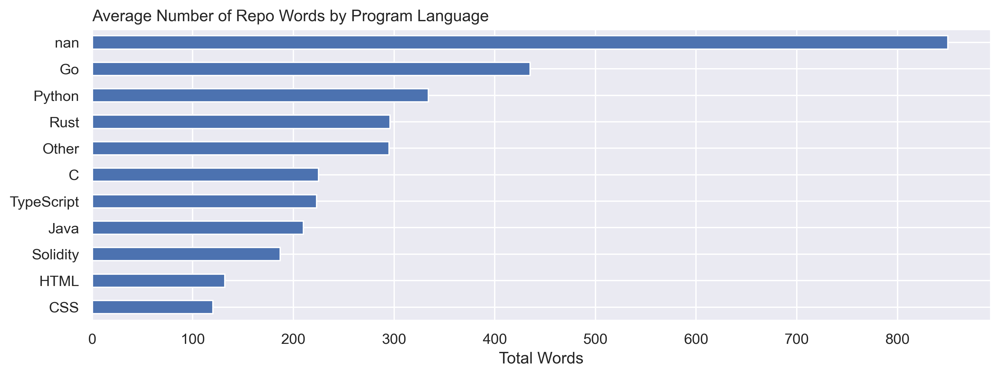

In [1458]:
mean_of_words = train.groupby("language")["word_count"].agg("mean").sort_values(ascending = False).round()

plt.figure(figsize = (12, 4))
mean_of_words.sort_values(ascending = True).plot.barh()

plt.ylabel(None)
plt.xlabel("Total Words")
plt.title("Average Number of Repo Words by Program Language", loc = "left", fontsize = 12)
plt.show()

------
#### ``4. Are there any words that uniquely identify a programming language?``

**Yes, there are differences in the "quality"/unique words used across programming languages. All programming languages appeared to use unique words across the "Metaverse" README files.**

**<u>Here are some of those words:</u>**

**Language: C**

<u>``Unique Words:``</u>

['mvp' '2017' '00093' 'vreng' 'vreng' 'allowing' 'navigation' 'internet'
 'recommendation' 'xorg']


**Language: CSS**

<u>``Unique Words:``</u>

['fun' 'shit' 'desenvolvimento' 'div' 'emblemas' 'forthebadge' 'love'
 'div' 'preview' 'calculator']


**Language: Go**

<u>``Unique Words:``</u>

['udpx' 'udpx' 'udp' 'nginx' 'tcp' 'software' 'appreciated' 'wa' 'typo'
 'aim']


**Language: HTML**

<u>``Unique Words:``</u>

['soft' 'dashboard' 'pro' 'creative' 'tim' 'soft' 'dashboard' 'pro'
 'dashboard' 'ref']


**Language: Java**

<u>``Unique Words:``</u>

['cryptoteckels' 'cryptoteckels' 'born' 'love' 'animal' 'especially'
 'teckel' 'dog' 'reserve' 'crytpoteckels']


**Language: Other**

<u>``Unique Words:``</u>

['intead' 'packed' 'recommended' 'block' 'separately' 'tarball' 'mvsd'
 'tar' 'packed' 'synced']


**Language: Python**

<u>``Unique Words:``</u>

['metagraspnet' 'maximiliangilles' 'metagraspnet' 'metagraspnet' 'dataset'
 'v0' 'evaluation' 'metric' 'metagraspnet' 'dataset']


**Language: Rust**

<u>``Unique Words:``</u>

['auction' 'sim' 'advert' 'board' 'solana' 'anchor' 'metaversevm' 'enter'
 'rocket' 'step']


**Language: Solidity**

<u>``Unique Words:``</u>

['drepublic' 'install' 'install' 'publish' 'truffle' 'verify' 'metacore'
 'everloot' 'everloot' 'truffle']

**Language: TypeScript**

<u>``Unique Words:``</u>

['yomo' 'vhq' 'nextjs' 'workplace' 'techcrunch' '2020' '11' '18' 'hq' 'race']


In [1533]:
# function to return unique words by program language

frames = [
    C_words,
    css_words,
    go_words,
    html_words,
    java_words, 
    other_words,
    python_words, 
    rust_words,
    solidity_words,
    typescript_words
]

# Python code to find frequency of each word
def find_unique_words(out_sample, frames):

    # returning unique words in ea. dataset

    frames = [df for df in frames if df != out_sample]
    
    # container to hold unique values
    container = []

    words = out_sample.split()

    # looping through ea. unique programmatic language
    for word in words:

        for i in range(len(frames)):
            # setting the words to compare againgst
            compare_words = frames[i].split()        
            
        # iterating through compare words
        if word in compare_words:

            # remove words that arent unique in larger pool and continue iteration(s)
            words.remove(word)
    
    # returning the count of unique words
    return pd.Series(words)

In [1534]:
# testing the function works
find_unique_words(python_words, frames).head(10) # checks out!

0        metagraspnet
1    maximiliangilles
2        metagraspnet
3        metagraspnet
4             dataset
5                  v0
6          evaluation
7              metric
8        metagraspnet
9             dataset
dtype: object

In [1538]:
# unique words by programming language

languages = [
 'C',
 'CSS',
 'Go',
 'HTML',
 'Java',
 'Other',
 'Python',
 'Rust',
 'Solidity',
 'TypeScript']

for i in range(len(languages)):
    # creating an object to analyze
    obj = find_unique_words(frames[i], frames)
    top_10 = obj.head(10).values

    print("Language:", languages[i])
    print(f'Total Unique Words: {len(obj)}')
    print("\n".join(top_10))
    print('----------------------')
    print()

Language: C
Total Unique Words: 5983
mvp
2017
00093
vreng
vreng
allowing
navigation
internet
recommendation
xorg

----------------------

Language: CSS
Total Unique Words: 635
fun
shit
desenvolvimento
div
emblemas
forthebadge
love
div
preview
calculator

----------------------

Language: Go
Total Unique Words: 1577
udpx
udpx
udp
nginx
tcp
software
appreciated
wa
typo
aim

----------------------

Language: HTML
Total Unique Words: 1276
soft
dashboard
pro
creative
tim
soft
dashboard
pro
dashboard
ref

----------------------

Language: Java
Total Unique Words: 15942
cryptoteckels
cryptoteckels
born
love
animal
especially
teckel
dog
reserve
crytpoteckels

----------------------

Language: Other
Total Unique Words: 2738
intead
packed
recommended
block
separately
tarball
mvsd
tar
packed
synced

----------------------

Language: Python
Total Unique Words: 3250
metagraspnet
maximiliangilles
metagraspnet
metagraspnet
dataset
v0
evaluation
metric
metagraspnet
dataset

----------------------

Lan